Importing the required packages

In [ ]:
import pandas as pd
import numpy as np
import pandas_datareader as pdr
%matplotlib inline
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
import string 
import spacy
import plotly.express as px
from pprint import pprint
import nltk
from wordcloud import WordCloud, STOPWORDS 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import wordpunct_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
stop_words = set(stopwords.words('english'))

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!jupyter labextension install jupyterlab-plotly
!pip install chart-studio
!pip install country-converter
!pip install scattertext

In [ ]:
#plotly for colab
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
  
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script 
  src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [ ]:
import scattertext as st
import country_converter as coco

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **1. UPenn student demographic data**

# 1.1 Data Cleaning

### 1.1.1 Loading the dataset and summarizing columns

We acquired UPenn SEAS graduate students demographic data from CETS. It was given to us in Google sheets format. 

We converted it to a Pandas dataframe to perfrom further analysis.

The dataset contains 5 rows and 2508 rows. 

The first column is the country code in ISO-2 format which represents the country of citizenship of students. The second column is the name of the degree each student is pursuing and the third column is a concatenation of country codes and program names. Each row represents a single student. 
The third column groups the students from the same country and degree and the fourth column shows it's count. 

In [345]:
from google.colab import auth
auth.authenticate_user()
import gspread
from google.auth import default
creds, _ = default()
gc = gspread.authorize(creds)
worksheet = gc.open('SEAS Demographic data').sheet1
rows = worksheet.get_all_values()
import pandas as pd
upenn_data = pd.DataFrame.from_records(rows)
upenn_data.head()

,0,1,2,3,4
0,Country Of Citizenship (CitzLang),Degree (DT),All Combinations,Unique Combinations,Count of each Unique Combination
1,AE,MSE,AE:MSE,AE:MSE,1
2,AL,BSE,AL:BSE,AL:BSE,1
3,AM,BSE,AM:BSE,AM:BSE,1
4,AR,MSE,AR:MSE,AR:MSE,4


### 1.1.2 Cleaning column headings

The titles of each column are in the first row and the column names are numbers. Thus, we transfer the first row to the column names and delete the first row.

Then, we convert the column names to lower case and replace any spaces found in them with underscores.

We also drop the empty rows at the end which could produce NA values later.

In [346]:
upenn_data.columns = upenn_data.iloc[0] # transfer column names from first row
upenn_data.columns = upenn_data.columns.str.lower()
upenn_data.columns = upenn_data.columns.str.replace(' ', '_')

### 1.1.3 Cleaning row data and dropping redundant columns

The first two columns provide us with sufficient information that is required for our analysis i.e., the country of citizenship of each student and the degree each student is pursuing currently. So, we drop the rest of the columns. 

We also drop the empty rows at the end which could produce NA values later

In [347]:
upenn_data.drop(['all_combinations',	'unique_combinations', 'count_of_each_unique_combination'],axis = 1, inplace=True) # drop redundant columns
upenn_data = upenn_data.drop([0,2507,2508],axis =0) #drop first row and empty rows
upenn_data.head()

,country_of_citizenship_(citzlang),degree_(dt)
1,AE,MSE
2,AL,BSE
3,AM,BSE
4,AR,MSE
5,AR,PHD


# 1.2 Extracting insights

### 1.2.1 Extracting numeric data

A new column 'Country names' is created that maps the IS0-2 country codes and output their names. 

A new dataframe is then created that has the count and percentage of students from each country

In [348]:
upenn_data['country_names']  = coco.convert(names=upenn_data['country_of_citizenship_(citzlang)'], to='names')
upenn_data1=upenn_data.groupby('country_names').count()['degree_(dt)'].reset_index(name='counts')
upenn_data1['percent'] = (upenn_data1['counts'] / upenn_data1['counts'].sum()) * 100
upenn_data1.head()

,country_names,counts,percent
0,Albania,1,0.039904
1,Argentina,8,0.319234
2,Armenia,1,0.039904
3,Australia,11,0.438947
4,Azerbaijan,1,0.039904


### 1.2.2 Visualisations for demographics

The following graph represents the population of students belonging to each country and their percent.

In [349]:
fig = px.choropleth(upenn_data1, 
                    locations="country_names", 
                    color="percent",  
                    hover_name="country_names",
                    hover_data=['counts'],
                    animation_group= "country_names",
                    locationmode = 'country names') 
fig.update_layout(
    title_text = 'SEAS Graduate Demographic', 
    geo_scope='world',) 
fig.show(renderer = 'colab')

In [350]:
top10 = upenn_data1.sort_values(by=['percent'],ascending = False).head(10)
others = upenn_data1.sort_values(by=['percent'],ascending = False).tail(upenn_data1['country_names'].nunique()-10)
new_others = pd.DataFrame()
new_others["country_names"] = ["Others"]
new_others["counts"]=others["counts"].sum()
new_others["percent"]=others["percent"].sum()
countries= pd.concat([top10, new_others], axis=0)
fig = px.pie(countries,values="percent", names="country_names", title='Population of Country', hover_data=['counts']) 
#TODO Better title? : SEAS Student Demographic by Percentage
fig.show(renderer = 'colab')

# 1.3 Expenses comparisons

To show the expenses of a student in SEAS. The data has been referred from the official Penn website: https://srfs.upenn.edu/costs-budgeting/seas



Loading the forex price data to make comparisons between countries.

In [351]:
df_forex=pd.read_csv('/content/drive/MyDrive/FOREX_Rate_2022_week43.csv')
df_forex

,Unnamed: 0,EUR,USD,JPY,CYP,CZK,DKK,EEK,GBP,HUF,LTL,LVL,MTL,PLN,ROL,...,YearAndWeek,BGN,TRY,HRK,RUB,CNY,IDR,MYR,PHP,THB,RON,BRL,MXN,INR,ILS
0,0,0.995421,1.0,102.259606,0.574029,35.937687,7.409218,15.574955,0.618853,253.533745,3.998507,0.585407,0.413199,4.139658,18260.999403,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,0.995421,1.0,102.259606,0.574029,35.937687,7.409218,15.574955,0.618853,253.533745,3.998507,0.585407,0.413199,4.139658,18260.999403,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,0.991080,1.0,101.833499,0.571556,35.741328,7.374034,15.507037,0.619029,252.259663,4.009316,0.586323,0.411397,4.146184,18110.009911,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,0.970403,1.0,102.746240,0.560408,35.196507,7.222610,15.183503,0.610966,246.986900,4.003979,0.582824,0.405822,4.116739,18299.854440,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,0.964506,1.0,103.530093,0.557292,35.047261,7.180170,15.091242,0.609954,245.476466,4.000482,0.582176,0.404610,4.111400,18305.362654,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,8332,1.015125,NaN,148.979799,NaN,24.852299,7.551010,NaN,0.883870,418.109837,NaN,NaN,NaN,4.863263,NaN,...,2022_43,1.985382,18.607045,7.647650,NaN,7.262613,15594.995432,4.737996,58.898589,38.168714,4.987108,5.223937,19.948635,82.778500,NaN
8333,8333,1.014096,NaN,148.909847,NaN,24.816956,7.543555,NaN,0.883714,419.531488,NaN,NaN,NaN,4.844336,NaN,...,2022_43,1.983369,18.609472,7.637664,NaN,7.308792,15624.297739,4.735524,58.805395,38.290234,4.972721,5.299057,19.912078,82.803975,NaN
8334,8334,0.997705,NaN,146.981942,NaN,24.478699,7.421032,NaN,0.864043,407.153547,NaN,NaN,NaN,4.743889,NaN,...,2022_43,1.951312,18.603312,7.514716,NaN,7.178290,15553.496957,4.715355,58.358775,37.775117,4.869400,5.282251,19.804550,82.017360,NaN
8335,8335,0.996314,NaN,146.826741,NaN,24.439574,7.411278,NaN,0.864252,410.630667,NaN,NaN,NaN,4.740958,NaN,...,2022_43,1.948590,18.612135,7.505231,NaN,7.228455,15571.445651,4.714955,58.225565,37.835010,4.871276,5.369035,19.941217,82.351300,NaN


The following dataset is used to get country names from ISO-3 country code names.

In [352]:
curr=pd.read_csv('/content/drive/MyDrive/country-code-to-currency-code-mapping.csv')
curr.shape

(250, 4)

In [353]:
upenn_data1.sort_values('percent', ascending=False).head(6)

,country_names,counts,percent
15,China,1324,52.833200
33,India,435,17.358340
74,South Korea,100,3.990423
13,Canada,89,3.551476
80,Taiwan,45,1.795690
29,Greece,32,1.276935


We have chosen to show our comparisons on the 5 countries with the most number of students at UPenn. 

We have used the API of the European Central Bank to access the forex price data. This website can be referred from here:
https://forex-python.readthedocs.io/en/latest/currencysource.html

The API does not support the forex prices of Taiwan, thus we have discarded it due to lack of data and considered the next country i.e Greece

In [354]:
top5=curr[curr['Country'].isin(upenn_data1.sort_values('percent', ascending=False).head(6)['country_names'].tolist())]['Code'].tolist()
top5.remove('TWD')
top5

['EUR', 'CAD', 'INR', 'CNY', 'KRW']

Select top 5 countries in forex price data set

In [355]:
df_forex=df_forex[top5+['YearAndWeek']]
df_forex= df_forex.drop_duplicates(subset = ['YearAndWeek'],keep = 'first')

### 1.3.1 Daily expenses

First, the weekly expenses of a student are taken to showcase how much difference occurs when an international student is paying the price.
To give an example we have chosen a commodity like **milk** that is required by almost every student on a regular basis. 

Here, we have considered the cost of 1 gallon of whole milk whose price is obtained from the following website: https://www.ams.usda.gov/sites/default/files/media/RetailMilkPrices.pdf

Next,  we consider the forex prices for year 2022, since the UPenn student data is available only for the year 2022.

In [358]:
milk_comparison = df_forex.tail(43)  #extract 2022 values
milk_comparison['Week_num'] = milk_comparison['YearAndWeek'].str.slice(5,7)   # create week column 
milk_comparison['Week_num'] = milk_comparison['Week_num'].astype('int64')  # convert from string to int
milk_comparison['milk_usd'] = 5.73 
milk_comparison = milk_comparison.set_index('Week_num')

for country in top5:
  milk_comparison[country] = milk_comparison[country] * milk_comparison['milk_usd']  # multiply with the cost of milk

milk_comparison = milk_comparison[top5]
milk_comparison = milk_comparison.T

for column in milk_comparison.columns[1:]:
  milk_comparison[column] = (milk_comparison[column] - milk_comparison[1]) /milk_comparison[1]  # calculate percentage change

milk_comparison[1] = [0.0] * 5    #Normalise first row to 0 to show comaprison
milk_comparison = milk_comparison.T

Text(0.5, 1.0, 'Milk prices in different currencies')

Text(0, 0.5, 'Percentage change in price')

Text(0.5, 0, 'Number of weeks')

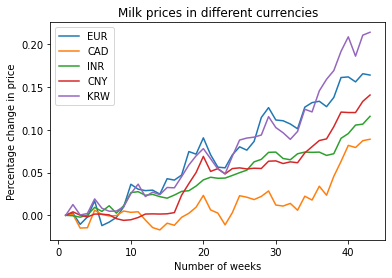

In [359]:
milk_comparison.plot.line( y = milk_comparison.columns)
plt.title("Milk prices in different currencies")
plt.ylabel("Percentage change in price")
plt.xlabel("Number of weeks")

### 1.3.2. Semester Fee expense

Now, we look at how much a student gets affected by paying the fees in the beginning of the semester and the end of the semester.

Considering a student takes 3 CU per semester, the fees per semester are $25,254.
Considering a student has paid the fees in the first week of first semester (which is mostly the case for students taking part in early registration)

In [361]:
student_fees = df_forex.tail(43)
student_fees['Week_num'] = student_fees['YearAndWeek'].str.slice(5,7)  # get number of weeks
student_fees['Week_num'] = student_fees['Week_num'].astype('int64') # convert to int from string
student_fees = student_fees.sort_values(by = 'Week_num', ascending = True)
student_fees = student_fees.set_index('Week_num')  # sort and set as index

To analyse one time payment, we have considered the first week of January and first week of September's data. These columns are considered because the semester fees are due during these weeks.

Text(0.5, 1.0, 'One time fee payment for Greece, Canada, China')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(20000.0, 179168.57982335624)

Text(0.5, 1.0, 'One time fee payment for India and South Korea')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(200000.0, 34756914.15309127)

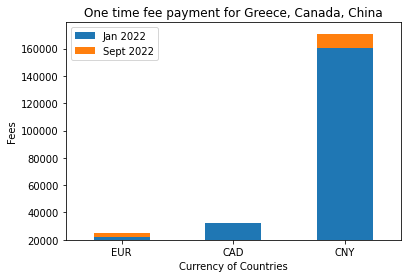

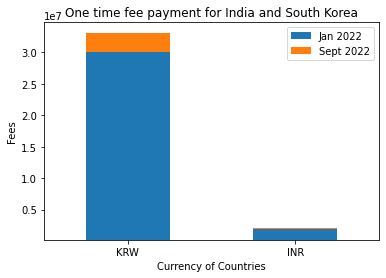

In [362]:
student_fees_one_time = student_fees[(student_fees.index == 1) | (student_fees.index == 30)]  

for country in top5:
  student_fees_one_time[country] = student_fees_one_time[country] * 25254 # multiply by fees

student_fees_one_time_KRW_INR = student_fees_one_time[['KRW','INR']].T
student_fees_one_time_KRW_INR.columns = ['Jan 2022', 'Sept 2022']
student_fees_one_time_KRW_INR['Sept 2022'] = student_fees_one_time_KRW_INR['Sept 2022'] - student_fees_one_time_KRW_INR['Jan 2022']   #calculate change from spring to fall price


student_fees_one_time = student_fees_one_time.T.drop(['YearAndWeek','KRW','INR'],axis =0)
student_fees_one_time.columns = ['Jan 2022', 'Sept 2022']
student_fees_one_time['Sept 2022'] = student_fees_one_time['Sept 2022'] - student_fees_one_time['Jan 2022']

student_fees_one_time.plot.bar(stacked=True,rot = 0)
plt.title("One time fee payment for Greece, Canada, China")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(20000)
student_fees_one_time_KRW_INR.plot.bar(stacked=True, rot = 0)
plt.title("One time fee payment for India and South Korea")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(200000)

To analyse the data for a student participating in payment plan, we have considered the first week of January and first week of September's data. 

These columns are considered because the semester fees are due during these weeks.

Here, we have considered 4 month payment plan where the student pays $6,313 per month  

Text(0.5, 1.0, 'Payment plan fee payment for Greece and Canada')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(5500.0, 8523.44883937224)

Text(0.5, 1.0, 'Payment plan fee payment for India and China')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(5000.0, 513842.1628101211)

Text(0.5, 1.0, 'Payment plan fee payment for South Korea')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(7000000.0, 8299584.996284852)

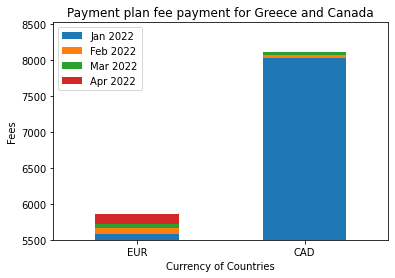

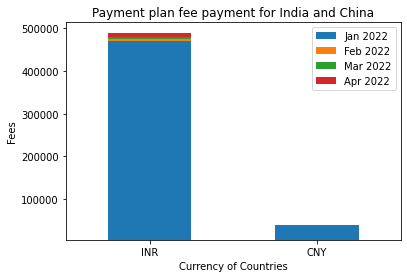

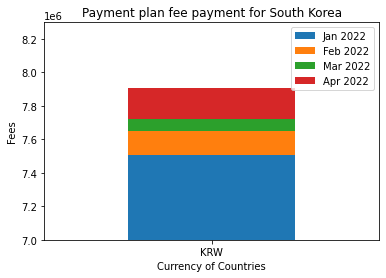

In [363]:
# include first week of each month
student_fees_payment_plan= student_fees[(student_fees.index ==1) | (student_fees.index == 5)| (student_fees.index == 9) | (student_fees.index == 14)]

for country in top5:
  student_fees_payment_plan[country] = student_fees_payment_plan[country] * 6313 # multiply by fees
  
student_fees_payment_plan_KRW = student_fees_payment_plan[['KRW']].T
student_fees_payment_plan_KRW.columns = ['Jan 2022', 'Feb 2022','Mar 2022', 'Apr 2022']

# calculate cumulative with respect to first month's fees
for column in student_fees_payment_plan_KRW.columns[1:]:
  student_fees_payment_plan_KRW[column] = student_fees_payment_plan_KRW[column] - student_fees_payment_plan_KRW['Jan 2022']


student_fees_payment_plan_INR_CNY= student_fees_payment_plan[['INR','CNY']].T
student_fees_payment_plan_INR_CNY.columns = ['Jan 2022', 'Feb 2022','Mar 2022', 'Apr 2022']

for column in student_fees_payment_plan_INR_CNY.columns[1:]:
  student_fees_payment_plan_INR_CNY[column] = student_fees_payment_plan_INR_CNY[column] - student_fees_payment_plan_INR_CNY['Jan 2022']


student_fees_payment_plan= student_fees_payment_plan.T.drop(['YearAndWeek','KRW','INR','CNY'],axis =0)
student_fees_payment_plan.columns = ['Jan 2022', 'Feb 2022','Mar 2022', 'Apr 2022']

for column in student_fees_payment_plan.columns[1:]:
  student_fees_payment_plan[column] = student_fees_payment_plan[column] - student_fees_payment_plan['Jan 2022']

# student_fees_payment_plan['Sept 2022'] = student_fees_payment_plan['Sept 2022'] - student_fees_payment_plan['Jan 2022']

student_fees_payment_plan.plot.bar(stacked=True, rot = 0)
plt.title("Payment plan fee payment for Greece and Canada")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(5500)

student_fees_payment_plan_INR_CNY.plot.bar(stacked=True,  rot = 0)
plt.title("Payment plan fee payment for India and China")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(5000)

student_fees_payment_plan_KRW.plot.bar(stacked=True,  rot = 0)
plt.title("Payment plan fee payment for South Korea")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(7000000)

Now, to compare how much a student is affected when they take part in the payment (4-month plan) v/s the one time payment plan.

Here,  we are showing predictions for Spring semester.

Text(0.5, 1.0, 'Comparison of fee payment for Greece')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(20000.0, 23711.665827055844)

Text(0.5, 1.0, 'omparison of fee payment for India')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(1500000.0, 1992708.7218868441)

Text(0.5, 1.0, 'omparison of fee payment for Canada')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(4500.0, 33697.23318912237)

Text(0.5, 1.0, 'omparison of fee payment for China')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(100000.0, 168444.0239184178)

Text(0.5, 1.0, 'omparison of fee payment for South Korea')

Text(0.5, 0, 'Currency of Countries')

Text(0, 0.5, 'Fees')

(2500000.0, 31939038.784912787)

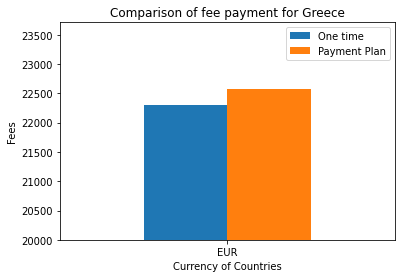

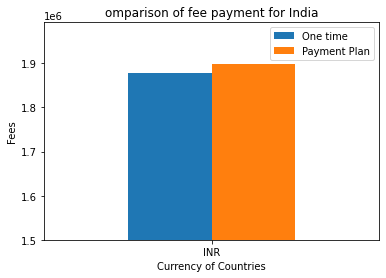

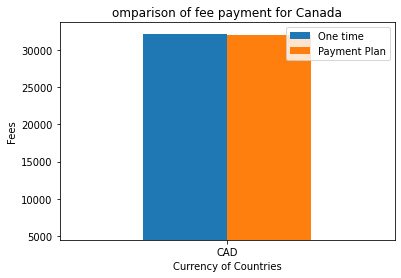

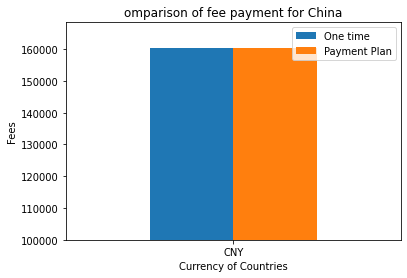

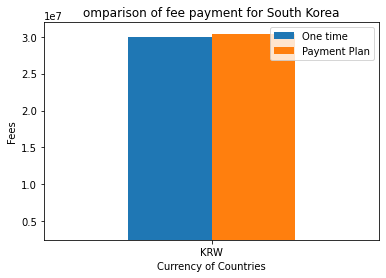

In [364]:
student_fees_one_time = student_fees[(student_fees.index == 1)] # one time payement in spring first week

for country in top5:
  student_fees_one_time[country] = student_fees_one_time[country] * 25254 # multiply total fees

# payment plan months - first week of 4 months of spring
student_fees_payment_plan= student_fees[(student_fees.index ==1) | (student_fees.index == 5)| (student_fees.index == 9) | (student_fees.index == 14)]

for country in top5:
  student_fees_payment_plan[country] = student_fees_payment_plan[country] * 6313   #multiply monthly fees  

student_fees_payment_plan = pd.DataFrame(student_fees_payment_plan.sum()).T  # take sum of monthly total fees

comparison_one_time_vs_plan = pd.concat([student_fees_one_time,student_fees_payment_plan])   # merge dataframes
# # comparison_one_time_vs_plan = comparison_one_time_vs_plan.T
comparison_one_time_vs_plan = comparison_one_time_vs_plan.T.drop(['YearAndWeek'], axis = 0)

comparison_one_time_vs_plan.columns = ['One time', 'Payment Plan']

comparison_one_time_vs_plan = comparison_one_time_vs_plan.T
eur_comparison = comparison_one_time_vs_plan[['EUR']]
inr_comparison = comparison_one_time_vs_plan[['INR']]
cad_comparison = comparison_one_time_vs_plan[['CAD']]
cny_comparison = comparison_one_time_vs_plan[['CNY']]
krw_comparison = comparison_one_time_vs_plan[['KRW']]


eur_comparison.T.plot.bar(rot = 0)
plt.title("Comparison of fee payment for Greece")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(20000)

inr_comparison.T.plot.bar(rot = 0)
plt.title("omparison of fee payment for India")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(1500000)

cad_comparison.T.plot.bar(rot = 0)
plt.title("omparison of fee payment for Canada")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(4500)

cny_comparison.T.plot.bar(rot = 0)
plt.title("omparison of fee payment for China")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(100000)

krw_comparison.T.plot.bar(rot = 0)
plt.title("omparison of fee payment for South Korea")
plt.xlabel("Currency of Countries")
plt.ylabel("Fees")
plt.ylim(2500000)

Now,  we compare how much students from each gain or lose money if they go ahead with payment plan or the one time payment. 
These changes are in USD.

In [366]:
# To merge the dataframes, we are using ISO-3 country codes
comparison_one_time_vs_plan = comparison_one_time_vs_plan.T.reset_index() # resetting index to help with merging later

In [367]:
## Get country names and currency names for the top 5 countries

top5=curr[curr['Country'].isin(upenn_data1.sort_values('percent', ascending=False).head(6)['country_names'].tolist())]
upenn_data2=upenn_data1[upenn_data1['country_names'].isin(top5.Country)]
upenn_data2=pd.merge(top5.head(5), upenn_data2, left_on='Country', right_on='country_names').drop('country_names', axis=1)
upenn_data2 

,Country,CountryCode,Currency,Code,counts,percent
0,Greece,GR,Euros,EUR,32,1.276935
1,Canada,CA,Canadian Dollar,CAD,89,3.551476
2,India,IN,Indian Rupee,INR,435,17.358340
3,China,CN,Yuan Renminbi,CNY,1324,52.833200
4,South Korea,KR,Won,KRW,100,3.990423


In [368]:
# Get forex price of January 2022 first week to convert to USD
student_fees_one_time = student_fees[(student_fees.index == 1)].drop('YearAndWeek',axis = 1)
student_fees_one_time = student_fees_one_time.T.reset_index()

# merge the dataframes on country code
comparison_usd  = pd.merge(comparison_one_time_vs_plan ,upenn_data2,left_on='index', right_on='Code').drop('index',axis =1)
comparison_usd = pd.merge(comparison_usd  ,student_fees_one_time , left_on='Code', right_on='index').drop('index',axis =1)

comparison_usd['forex of Jan'] = comparison_usd[1]
comparison_usd = comparison_usd.drop(1,axis = 1)

# use formula to calculate change in price for students of all countries if they opt for payment plan over one time payment
comparison_usd['Comparison'] = (comparison_usd['Payment Plan'] - 
                                             comparison_usd['One time']) * (comparison_usd['counts'] / comparison_usd['forex of Jan'])
comparison_usd

,One time,Payment Plan,Country,CountryCode,Currency,Code,counts,percent,forex of Jan,Comparison
0,22297.368886,22582.538883,Greece,GR,Euros,EUR,32,1.276935,0.882924,10335.473241
1,32092.603037,32041.616225,Canada,CA,Canadian Dollar,CAD,89,3.551476,1.270793,-3570.862272
2,1878089.543352,1897817.830368,India,IN,Indian Rupee,INR,435,17.358340,74.368003,115396.46792
3,160422.879922,160292.448081,China,CN,Yuan Renminbi,CNY,1324,52.833200,6.352375,-27185.384311
4,30020731.520396,30418132.176107,South Korea,KR,Won,KRW,100,3.990423,1188.751545,33430.085315


Text(0.5, 1.0, 'Comparison of fees in USD')

Text(0.5, 0, 'Countries')

Text(0, 0.5, 'Fees in USD')

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

[Text(0, 0, 'Greece'),
 Text(0, 0, 'Canada'),
 Text(0, 0, 'India'),
 Text(0, 0, 'China'),
 Text(0, 0, 'South Korea')]

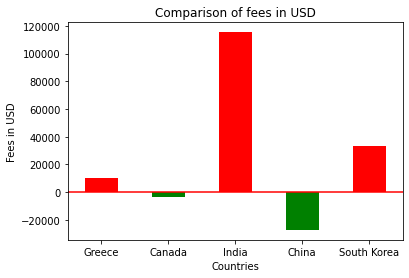

In [369]:
labels = ['Greece','Canada','India','China','South Korea']
comparison_usd['Comparison'].plot.bar(color=['red', 'green', 'red', 'green', 'red'])
plt.axhline(y = 0.0, color = 'r', linestyle = '-')
ax = plt.axes()
plt.title("Comparison of fees in USD")
plt.xlabel("Countries")
plt.ylabel("Fees in USD")
plt.xticks(rotation = 0)
ax.set_xticklabels(labels)

# **2. Time Series - Historical Forex**

# 2.1 Foreign Currency Trends for Major Demographics

In [ ]:
df_forex=pd.read_csv('/content/drive/MyDrive/FOREX_Rate_2022_week43.csv')
df_forex.head()

,Unnamed: 0,EUR,USD,JPY,CYP,CZK,DKK,EEK,GBP,HUF,LTL,LVL,MTL,PLN,ROL,...,YearAndWeek,BGN,TRY,HRK,RUB,CNY,IDR,MYR,PHP,THB,RON,BRL,MXN,INR,ILS
0,0,0.995421,1.0,102.259606,0.574029,35.937687,7.409218,15.574955,0.618853,253.533745,3.998507,0.585407,0.413199,4.139658,18260.999403,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,0.995421,1.0,102.259606,0.574029,35.937687,7.409218,15.574955,0.618853,253.533745,3.998507,0.585407,0.413199,4.139658,18260.999403,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,0.991080,1.0,101.833499,0.571556,35.741328,7.374034,15.507037,0.619029,252.259663,4.009316,0.586323,0.411397,4.146184,18110.009911,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,0.970403,1.0,102.746240,0.560408,35.196507,7.222610,15.183503,0.610966,246.986900,4.003979,0.582824,0.405822,4.116739,18299.854440,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,0.964506,1.0,103.530093,0.557292,35.047261,7.180170,15.091242,0.609954,245.476466,4.000482,0.582176,0.404610,4.111400,18305.362654,...,2000_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We want to keep only top 5 currencies. Hence we filter out the columns based on previous analysis. 

In [ ]:
df_forex=df_forex[top5+['YearAndWeek','Date']]
df_forex.columns

Index(['EUR', 'CAD', 'INR', 'CNY', 'KRW', 'YearAndWeek', 'Date'], dtype='object')

In [ ]:
df_forex.isnull().sum()

EUR               0
CAD               0
INR            3289
CNY            1917
KRW               0
YearAndWeek       0
Date              0
dtype: int64

Handling missing values using bfill as values were not missing in a chunk and were scattered. Bfill seems to be the more appropriate way of filling in missing data in a time series if nulls are scattered. 

In [ ]:
df_forex.fillna(method='bfill', inplace=True)
df_forex.isnull().sum()

EUR            0
CAD            0
INR            0
CNY            0
KRW            0
YearAndWeek    0
Date           0
dtype: int64

Visualizing trendlines - Exchange rates of top 5 currencies

In [ ]:
enable_plotly_in_cell()
for i in upenn_data1.sort_values('percent', ascending=False).head(4)['country_names'].tolist():
    fig = px.line(df_forex, x='YearAndWeek', y=str(curr[curr['Country']==i]['Code'].values[0]), title=i)
    fig.show()

Visualizing distributions - Exchange rates of top 5 currencies

Text(0.5, 1.0, 'EUR')

(array([0.76087286, 2.4401111 , 3.55892146, 3.37893003, 3.36052182,
        1.14949073, 0.70360286, 0.52770215, 0.91427465, 0.257715  ]),
 array([0.62539087, 0.68403453, 0.74267818, 0.80132184, 0.8599655 ,
        0.91860915, 0.97725281, 1.03589647, 1.09454012, 1.15318378,
        1.21182744]),
 <a list of 10 Patch objects>)

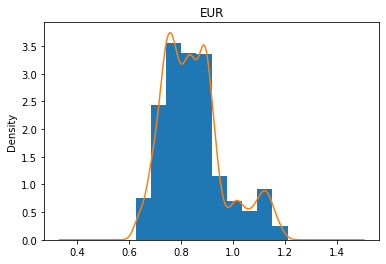

Text(0.5, 1.0, 'CAD')

(array([0.31581509, 2.57718628, 1.4203235 , 1.16868474, 1.7361386 ,
        3.32703603, 1.32405901, 0.47287822, 0.89509091, 0.84273654]),
 array([0.90707784, 0.97810083, 1.04912381, 1.1201468 , 1.19116978,
        1.26219277, 1.33321575, 1.40423874, 1.47526172, 1.54628471,
        1.61730769]),
 <a list of 10 Patch objects>)

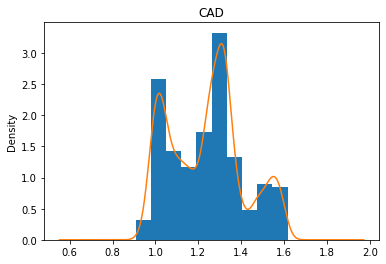

Text(0.5, 1.0, 'INR')

(array([0.02348689, 0.11319204, 0.0128809 , 0.00319717, 0.01930597,
        0.03003493, 0.01859891, 0.02428618, 0.00783921, 0.00347385]),
 array([44.02158478, 47.9233228 , 51.82506083, 55.72679885, 59.62853688,
        63.5302749 , 67.43201292, 71.33375095, 75.23548897, 79.137227  ,
        83.03896502]),
 <a list of 10 Patch objects>)

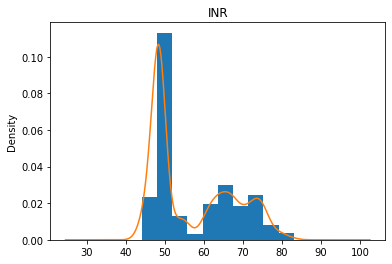

Text(0.5, 1.0, 'CNY')

(array([0.55040067, 0.68142288, 0.49348119, 0.85218133, 0.29050416,
        0.05047577, 0.08752713, 0.11169106, 0.1605559 , 1.19853103]),
 array([6.04280383, 6.26617911, 6.48955439, 6.71292967, 6.93630495,
        7.15968023, 7.38305551, 7.60643079, 7.82980607, 8.05318134,
        8.27655662]),
 <a list of 10 Patch objects>)

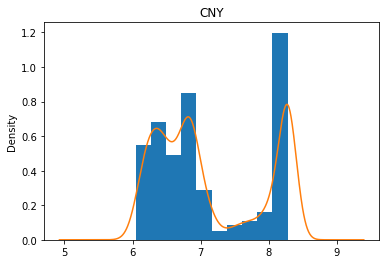

Text(0.5, 1.0, 'KRW')

(array([1.28000042e-03, 1.06901134e-03, 2.24351723e-03, 5.35560617e-03,
        2.86417677e-03, 1.11296740e-03, 4.74725432e-04, 1.67033022e-04,
        7.03296937e-05, 2.10989081e-05]),
 array([ 900.80293487,  969.02289543, 1037.24285599, 1105.46281655,
        1173.68277711, 1241.90273768, 1310.12269824, 1378.3426588 ,
        1446.56261936, 1514.78257993, 1583.00254049]),
 <a list of 10 Patch objects>)

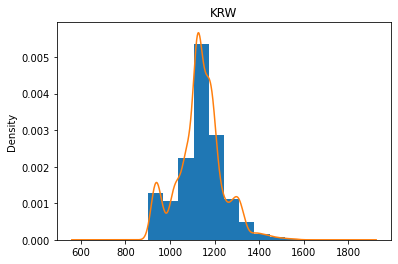

In [ ]:
for i in df_forex.columns:
  if i!='Date' and i!='YearAndWeek':
    plt.title(i)
    plt.hist(df_forex[i],density=True)
    df_forex[i].plot(kind = "kde")
    plt.show()


We should exclude data older than 10-15 years as outdated trends affect the model. 

In [ ]:
df_forex.set_index('YearAndWeek', inplace=True)
df_forex1=df_forex['2009_5':]

Boxplots give us the currency statistics for each year. We can infer the annual minimum, maximum, median and the Interquartile range.

Text(0.5, 1.0, 'EUR')

Text(0.5, 1.0, 'CAD')

Text(0.5, 1.0, 'INR')

Text(0.5, 1.0, 'CNY')

Text(0.5, 1.0, 'KRW')

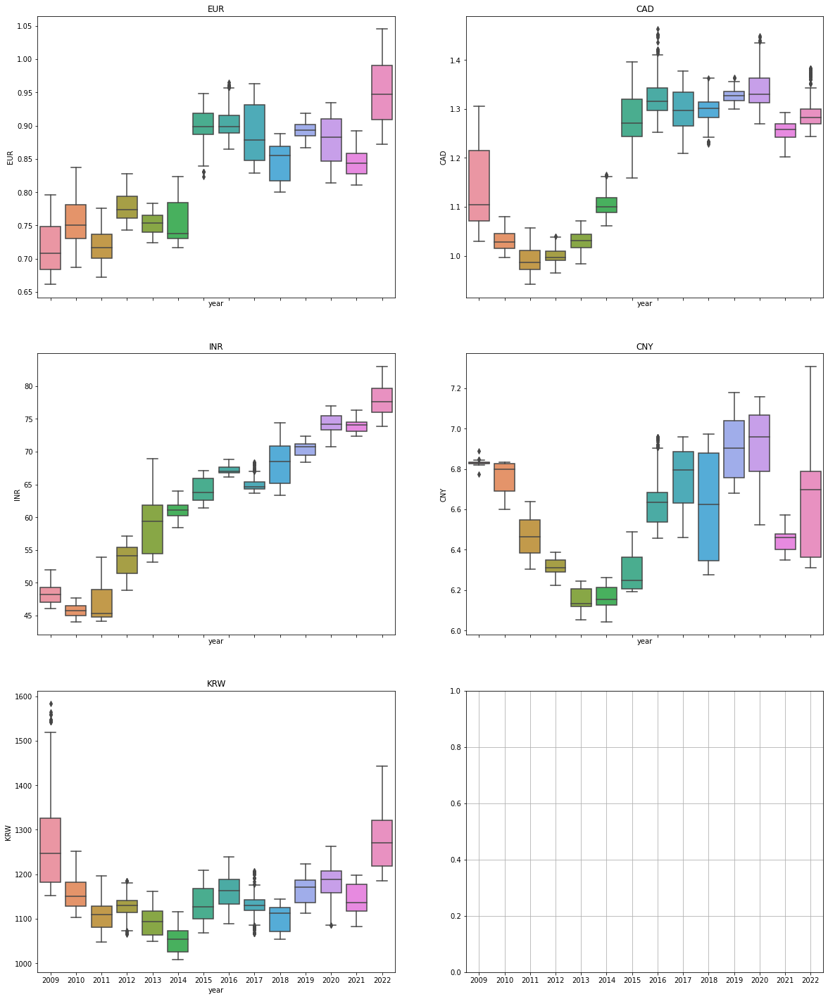

In [ ]:
df_forex1.reset_index(inplace=True)
df_forex1['year']=df_forex1['YearAndWeek'].apply(lambda x: x[:4])
df_forex1.set_index('YearAndWeek', inplace=True)

fig, axes = plt.subplots(3, 2, sharex=True, figsize=(20,25))
plt.grid(True)
i=0
sns.boxplot(ax=axes[0, 0], x='year', y=df_forex1.columns[i], data=df_forex1)
axes[0,0].set_title(df_forex1.columns[i])
i+=1
sns.boxplot(ax=axes[0, 1], x='year', y=df_forex1.columns[i], data=df_forex1)
axes[0,1].set_title(df_forex1.columns[i])
i+=1
sns.boxplot(ax=axes[1, 0], x='year', y=df_forex1.columns[i], data=df_forex1)
axes[1,0].set_title(df_forex1.columns[i])
i+=1
sns.boxplot(ax=axes[1, 1], x='year', y=df_forex1.columns[i], data=df_forex1)
axes[1,1].set_title(df_forex1.columns[i])
i+=1
sns.boxplot(ax=axes[2, 0], x='year', y=df_forex1.columns[i], data=df_forex1)
axes[2,0].set_title(df_forex1.columns[i])

# 2.2 Checking for stationarity

In [ ]:
df_forex1.reset_index(inplace=True)
df_forex1['Date']=pd.to_datetime(df_forex1['Date'])
df_forex1['Date']= df_forex1['Date'].dt.strftime('%Y-%m-%d')
df_forex1['Date']=pd.to_datetime(df_forex1['Date'])
df_forex1.head()

,YearAndWeek,EUR,CAD,INR,CNY,KRW,Date,year
0,2009_5,0.762718,1.217527,48.720159,6.837999,1369.697201,2009-01-29,2009
1,2009_5,0.780275,1.240247,48.689919,6.838015,1394.998439,2009-01-30,2009
2,2009_5,0.780275,1.240247,48.689919,6.838015,1394.998439,2009-01-31,2009
3,2009_5,0.780275,1.240247,48.689919,6.838015,1394.998439,2009-02-01,2009
4,2009_5,0.783699,1.242163,48.640282,6.848668,1397.468652,2009-02-02,2009


Visualizing 30 day rolling mean for each currency to check if series are stationary

<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'EUR')

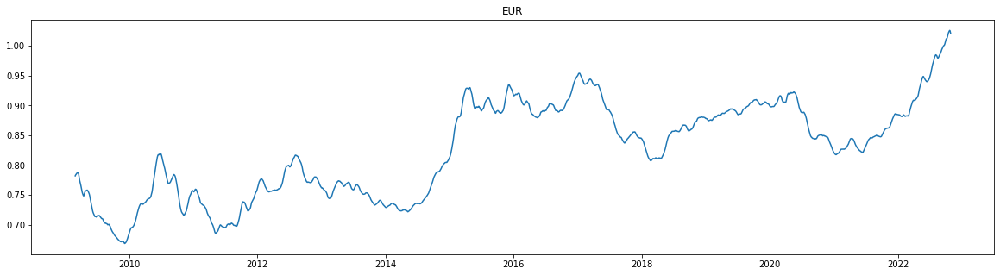

<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'CAD')

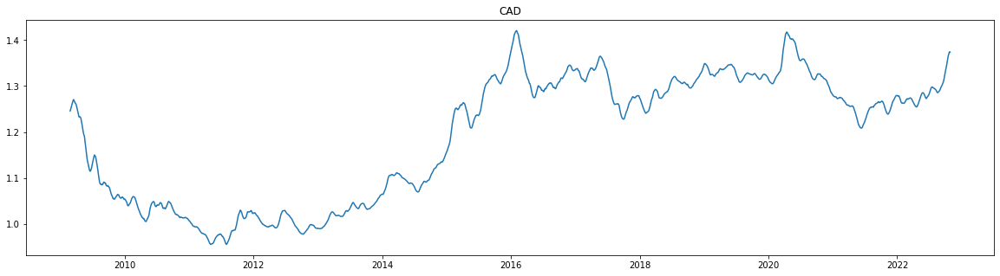

<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'INR')

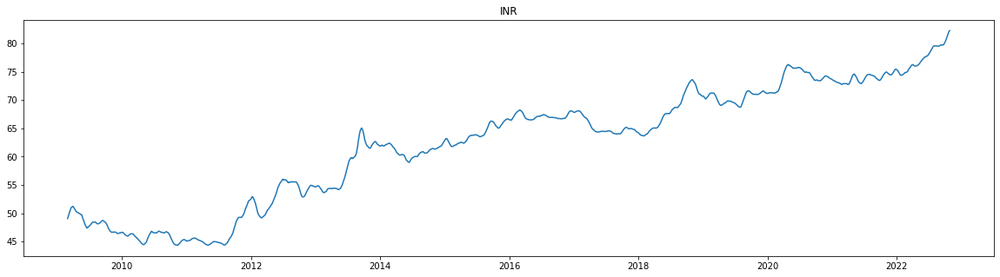

<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'CNY')

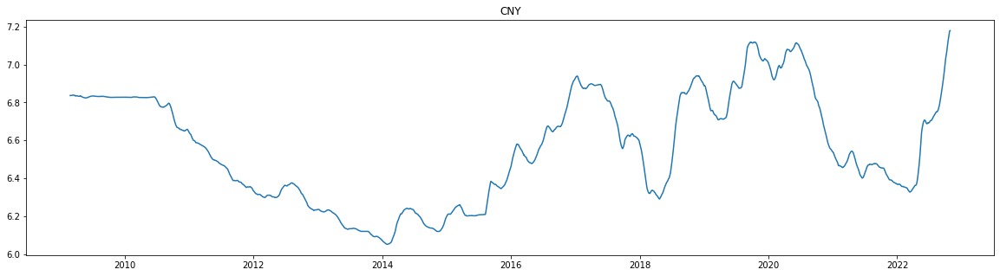

<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'KRW')

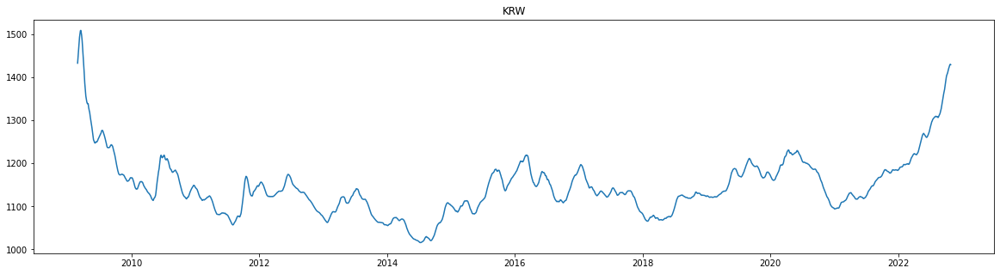

In [ ]:
df_forex1.set_index('Date', inplace=True)
for i in df_forex1.columns:
  if i!='year' and i!='YearAndWeek':
    plt.figure(figsize=(20,5))
    plt.title(i)
    rm=pd.Series.rolling(df_forex1[i], center=False, window=30).mean()
    plt.plot(rm)
    plt.show()

Based on above visulaizations of the moving average, it seems that except for KRW, all other currencies show seasonality. For our time series to be stationary, we need to ensure that the rolling statistics remain time invariant or constant with time. Thus the curves have to be parallel to the x-axis, which is not the case. We test this hypothesis with Augmented Dickey Fuller test.

In [ ]:
from statsmodels.tsa.stattools import adfuller
def df_test(ts):
  test=adfuller(ts, autolag='AIC', maxlag=30)
  if test[1]<0.05:
    print('series {x} is stationary with a lag of {y}'.format(x=i, y=test[2]))
  else:
    print('series {x} is not stationary with a lag of {y}'.format(x=i, y=test[2]))

currencies=['EUR','CAD','INR','CNY','KRW']
for i in currencies: 
  df_test(df_forex1[i])

series EUR is not stationary with a lag of 0
series CAD is not stationary with a lag of 0
series INR is not stationary with a lag of 13
series CNY is not stationary with a lag of 28
series KRW is stationary with a lag of 27


Hence we conclude that only KRW is a stationary time series

Showing time dependence of our data using a heatmap - average exchange rate per year increasing year on year. 

<Figure size 1080x720 with 0 Axes>

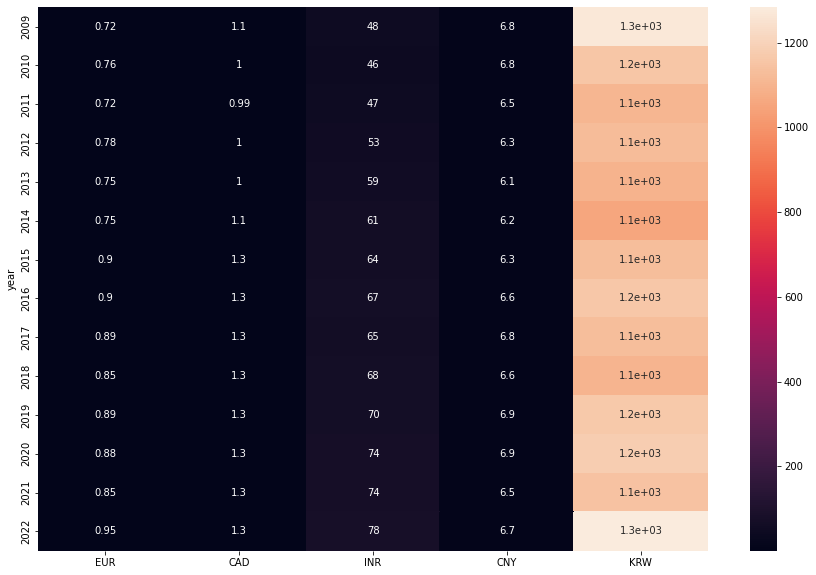

In [ ]:
df_avg=df_forex1.groupby('year').mean()
plt.figure(figsize=(15,10))
sns.heatmap(df_avg, annot=True)

We want to smoothen our time series to ensure no seasonality and hence better predictions.

In [ ]:
for i in currencies: 
  ts_log=np.log(df_forex1[i])
  rm=pd.Series.rolling(ts_log, center=False, window=15).mean()
  df_forex1[i+'_new']=ts_log-rm

df_forex1.dropna(inplace=True)
df_forex1.head()

,YearAndWeek,EUR,CAD,INR,CNY,KRW,year,EUR_new,CAD_new,INR_new,CNY_new,KRW_new
Date,,,,,,,,,,,,
2009-02-12,2009_7,0.779241,1.246318,48.590353,6.834178,1412.802930,2009,0.002329,0.005051,-0.000405,-0.000352,0.017833
2009-02-13,2009_7,0.779849,1.234734,48.424706,6.833502,1404.749279,2009,0.001628,-0.005222,-0.003414,-0.000407,0.010432
2009-02-14,2009_7,0.779849,1.234734,48.424706,6.833502,1404.749279,2009,0.001664,-0.004925,-0.003050,-0.000362,0.009968
2009-02-15,2009_7,0.779849,1.234734,48.424706,6.833502,1404.749279,2009,0.001701,-0.004628,-0.002686,-0.000318,0.009503
2009-02-16,2009_7,0.783392,1.246533,48.619663,6.833999,1430.928320,2009,0.005968,0.004545,0.001428,-0.000207,0.026273


In [ ]:
for i in currencies: 
  df_test(df_forex1[i+'_new'])

series EUR is stationary with a lag of 21
series CAD is stationary with a lag of 14
series INR is stationary with a lag of 28
series CNY is stationary with a lag of 26
series KRW is stationary with a lag of 28


In [ ]:
# for i in currencies:
#   df_forex1[i]=df_forex1[i].apply(lambda x: 1/x)
# df_forex1.head()

# 2.3 ARIMA

ARIMA stands for ‘AutoRegressive Integrated Moving Average’, an algorithm originating from the belief that the past values of a time series can alone be used to predict future values.

In [ ]:
def plot_series(ts, heading):
  plt.figure(figsize=(10,8))
  plt.plot(ts)
  plt.title(heading)
  plt.show()

Let's take EUR and visualize its various transformations to identify what best fits the data

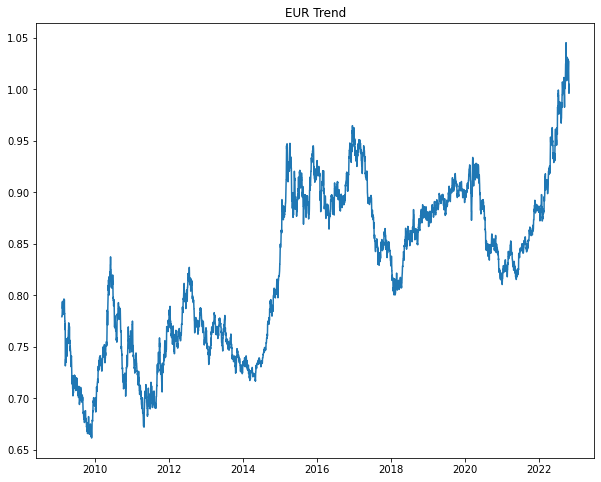

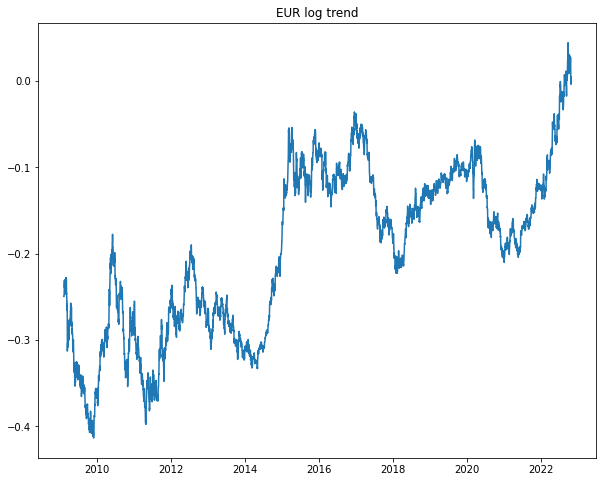

In [ ]:
ts=df_forex1[['EUR']]
plot_series(ts, 'EUR Trend')
ts_log=np.log(ts)
plot_series(ts_log, 'EUR log trend')

<Figure size 720x432 with 0 Axes>

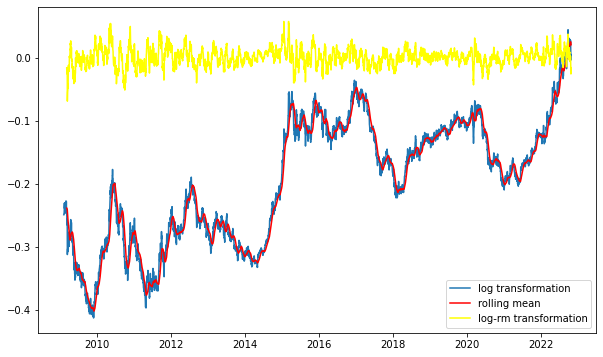

In [ ]:
rm=pd.Series.rolling(ts_log, center=False, window=30).mean()
ts_log_minus_rm=ts_log-rm
ts_log_minus_rm.dropna(inplace=True)
plt.figure(figsize=(10,6))
plt.plot(ts_log,label='log transformation')
plt.plot(rm, color='red', label='rolling mean')
plt.plot(ts_log_minus_rm, color='yellow', label='log-rm transformation')
plt.legend()
plt.show()

<Figure size 1440x432 with 0 Axes>

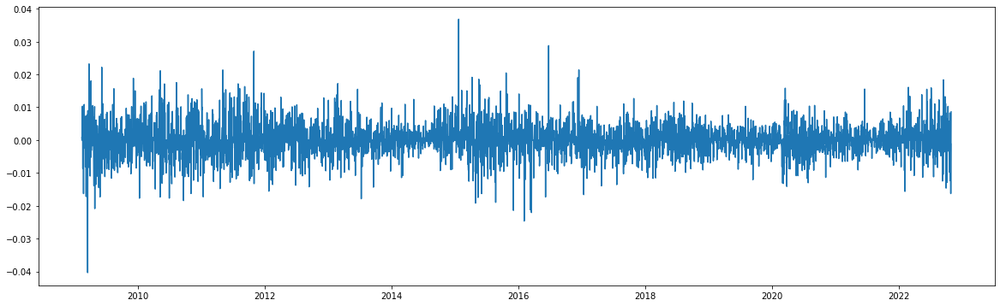

In [ ]:
ts_shift_log = ts_log - ts_log.shift()
ts_shift_log.dropna(inplace=True)
plt.figure(figsize=(20,6))
plt.plot(ts_shift_log)
plt.show()

Autocorrelation (ACF) and Partial Autocorrelation (PACF)

These are plots that graphically summarize the strength of a relationship with an observation in a time series with observations at prior time steps.

ACF plot is a bar chart of coefficients of correlation between a time series and it lagged values. Simply stated: ACF explains how the present value of a given time series is correlated with the past (1-unit past, 2-unit past, …, n-unit past) values. 

PACF is the partial autocorrelation function that explains the partial correlation between the series and lags itself.

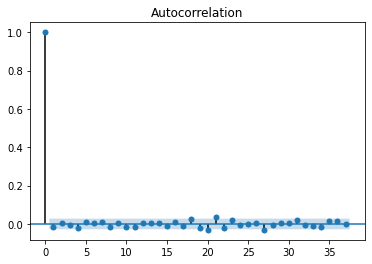

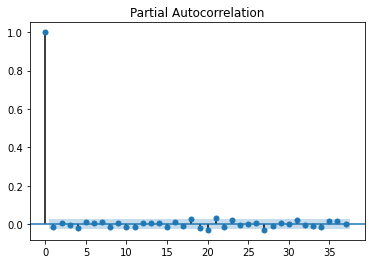

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(ts_shift_log);
plot_pacf(ts_shift_log);

We can either forecast for several days in chunk, or do a rolling forecast. A rolling forecasting procedure is required given the dependence on observations in prior time steps for differencing and the AR model. To this end, we re-create the ARIMA model after each new observation is received.

To use ARIMA, we need to determine the values for its parameter: p, d, q

p: the order of the AR term (AR: Auto-Regressive)
d: the number of differencing
q: the order of the MA term (MA: Moving Average)

find_pdq function below, acts like a grid search to tune ARIMA model and train it with best p,d,q for each currency independently. 

Data Prep and Models - Daily prediction

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from statsmodels.tsa.arima_model import ARIMA
import itertools

def arima_model_data_prep(curr):
  df_forex2=df_forex1.reset_index().set_index('Date')[[curr]].sort_index(ascending=True)
  train, test = df_forex2[0:int(len(df_forex2)* 0.7)].values, df_forex2[int(len(df_forex2) * 0.7):]
  return train, test

#continuous forecast
def arima_model_continuous(train, test, n, param):
  model = ARIMA(np.log(train), order=param, missing='Drop')
  model_fit = model.fit()
  preds, se, conf = model_fit.forecast(n, alpha=0.05)
  preds=np.exp(preds)
  preds1 = pd.Series(preds, index=test.index)
  rmse = sqrt(mean_squared_error(test, preds1))
  return preds1, rmse, model_fit.aic

#rolling forecast
def arima_model_rolling(train, test, param):
  test1=test.values
  data = [i for i in train]
  preds = []
  model_aic=[]
  for t in range(len(test1)):
    model = ARIMA(data, order=param)
    model_fit = model.fit()
    pred = model_fit.forecast()[0]
    preds.append(pred)
    data.append(test1[t])
    model_aic.append(model_fit.aic)
  preds1 = pd.Series(preds, index=test.index)
  rmse = sqrt(mean_squared_error(test1, preds))
  return preds1, rmse, sum(model_aic)/len(model_aic)


Data Prep and Models - Weekly average prediction

In [ ]:
df_forex1.reset_index(inplace=True)
df_forex2=df_forex1.groupby('YearAndWeek')['EUR','CAD','INR','CNY','KRW'].mean().reset_index()
df_forex3=df_forex1.groupby('YearAndWeek')['Date'].min().reset_index()
df_forex4=pd.merge(df_forex2, df_forex3, on='YearAndWeek')
df_forex1.set_index('Date',inplace=True)

def arima_model_data_prep_weekly(curr):
  df_forex2=df_forex4.reset_index().set_index('Date')[[curr]].sort_index(ascending=True)
  train, test = df_forex2[0:int(len(df_forex2)* 0.9)].values, df_forex2[int(len(df_forex2) * 0.9):]
  return train, test

def find_pdq(ts):
  p = range(1, 4)
  d = range(1, 2)
  q = range(1, 4)
  aics = []
  params=[]
  pdq = list(itertools.product(p, d, q))
  #pdq = [(3,1,3),(1,1,1), (3,1,2)]
  for param in pdq:
      model = ARIMA(np.log(ts), order=param)
      model_fit = model.fit()
      aics.append(model_fit.aic)
      params.append(param)
  combo = list(zip(aics, params))
  combo.sort()
  combo_array = np.array(combo)
  print(combo_array)
  return combo_array[0][1]

#rolling forecast
def arima_model_rolling_weekly(train, test, param):
  test1=test.values
  data = [i for i in train]
  preds = []
  model_aic=[]
  for t in range(len(test1)):
    model = ARIMA(data, order=param)
    model_fit = model.fit()
    pred = model_fit.forecast()[0]
    preds.append(pred)
    val = test1[t]
    data.append(val)
    model_aic.append(model_fit.aic)
  preds1 = pd.Series(preds, index=test.index)
  rmse = sqrt(mean_squared_error(test1, preds))
  return preds1, rmse, sum(model_aic)/len(model_aic)


Generating weekly predictions and evaluating results - next week's average exchange rates




[[-2951.106839774805 (3, 1, 3)]
 [-2913.711341467092 (2, 1, 3)]
 [-2913.220344391385 (3, 1, 2)]
 [-2910.55704745609 (1, 1, 3)]
 [-2908.652558219743 (2, 1, 2)]
 [-2906.309367717966 (3, 1, 1)]
 [-2903.5656268555513 (1, 1, 1)]
 [-2903.509969663286 (2, 1, 1)]
 [-2902.9693873762726 (1, 1, 2)]]


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Comparing predictions to actual values for EUR')

(array([737791., 737881., 737972., 738064., 738156., 738246., 738337.,
        738429.]), <a list of 8 Text major ticklabel objects>)

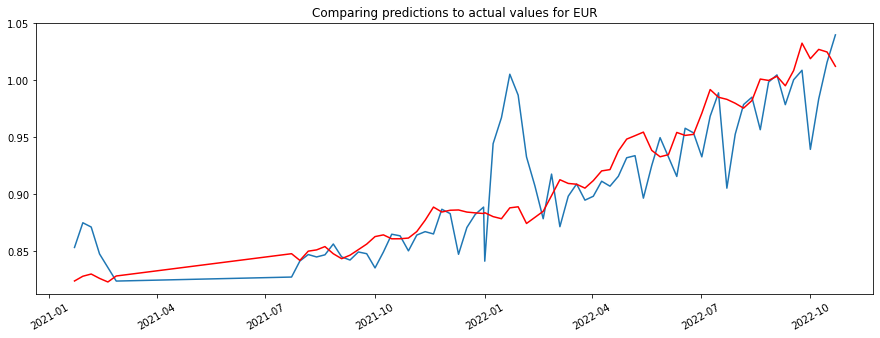

[[-3103.5408663728213 (3, 1, 3)]
 [-3089.4247497278047 (2, 1, 3)]
 [-3082.376699303999 (1, 1, 3)]
 [-3079.7522061657764 (3, 1, 1)]
 [-3079.4162132383753 (3, 1, 2)]
 [-3071.2404589936514 (1, 1, 1)]
 [-3071.0423474830422 (2, 1, 2)]
 [-3070.793075701551 (2, 1, 1)]
 [-3070.2336028744085 (1, 1, 2)]]


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Comparing predictions to actual values for CAD')

(array([737791., 737881., 737972., 738064., 738156., 738246., 738337.,
        738429.]), <a list of 8 Text major ticklabel objects>)

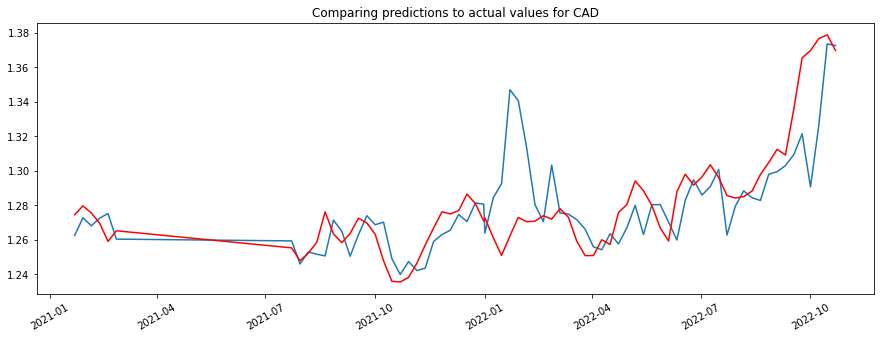

[[-2957.00540413248 (3, 1, 3)]
 [-2906.050881854663 (2, 1, 3)]
 [-2890.317492951155 (3, 1, 2)]
 [-2882.808773521968 (1, 1, 3)]
 [-2881.4936478450263 (2, 1, 2)]
 [-2876.0562266240377 (3, 1, 1)]
 [-2875.8017102226913 (2, 1, 1)]
 [-2874.2348566759174 (1, 1, 2)]
 [-2873.0750305799384 (1, 1, 1)]]


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Comparing predictions to actual values for INR')

(array([737791., 737881., 737972., 738064., 738156., 738246., 738337.,
        738429.]), <a list of 8 Text major ticklabel objects>)

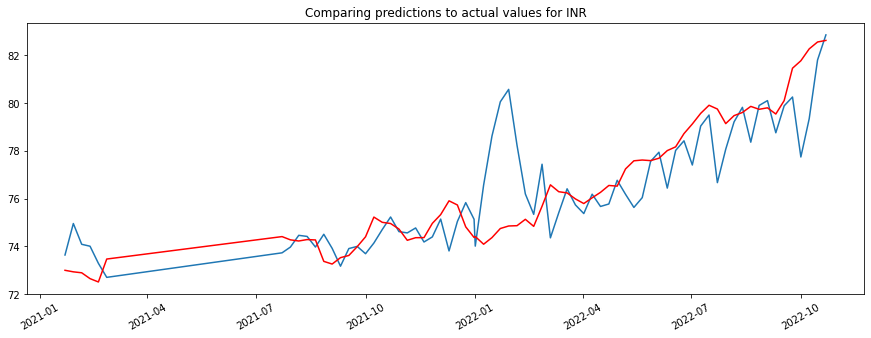

[[-3791.0974426550574 (3, 1, 3)]
 [-3758.826566450519 (2, 1, 3)]
 [-3747.1764729017123 (3, 1, 2)]
 [-3746.3464512844203 (1, 1, 3)]
 [-3737.661790907693 (2, 1, 2)]
 [-3736.191977612122 (3, 1, 1)]
 [-3731.8446381180293 (1, 1, 1)]
 [-3731.7163503472566 (2, 1, 1)]
 [-3731.02042063465 (1, 1, 2)]]


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Comparing predictions to actual values for CNY')

(array([737791., 737881., 737972., 738064., 738156., 738246., 738337.,
        738429.]), <a list of 8 Text major ticklabel objects>)

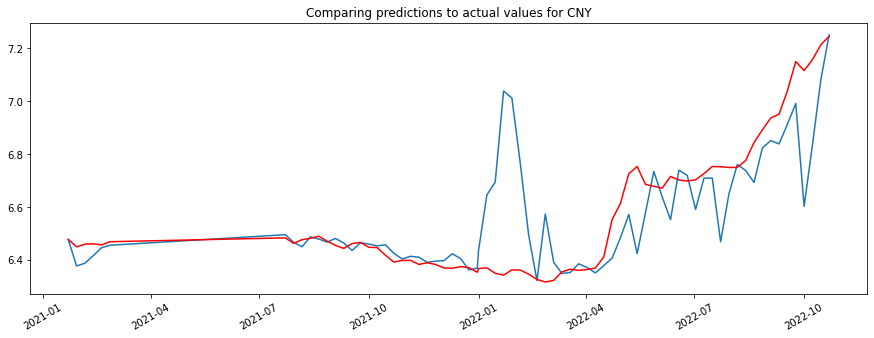

[[-2992.6054989876784 (3, 1, 3)]
 [-2964.8211760413305 (2, 1, 3)]
 [-2957.1284912266865 (1, 1, 3)]
 [-2953.618261072893 (3, 1, 1)]
 [-2951.619698595666 (3, 1, 2)]
 [-2950.3635491868317 (1, 1, 1)]
 [-2950.176829853094 (2, 1, 1)]
 [-2949.952627945584 (2, 1, 2)]
 [-2949.720591952053 (1, 1, 2)]]


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Comparing predictions to actual values for KRW')

(array([737791., 737881., 737972., 738064., 738156., 738246., 738337.,
        738429.]), <a list of 8 Text major ticklabel objects>)

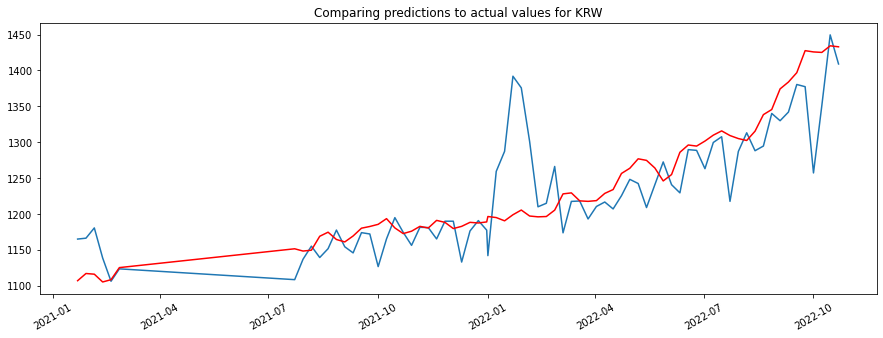

In [ ]:
predictions={}
aic_score={}
rmse_models={}
for i in currencies:
  train, test = arima_model_data_prep_weekly(i)
  param = find_pdq(train)
  pred, rmse, aic = arima_model_rolling_weekly(train, test, param)
  predictions[i]=pred
  aic_score[i]=aic
  rmse_models[i]=rmse
  plt.figure(figsize=(15,5))
  plt.title('Comparing predictions to actual values for {x}'.format(x=i))
  pred1=pred.reset_index().sort_values('Date', ascending=True)
  test1=test.reset_index().sort_values('Date', ascending=True)
  plt.plot(pred1['Date'],pred1[0])
  plt.plot(test1['Date'],test1[i], color='red')
  plt.xticks(rotation=30)
  plt.show()
  

In [ ]:
rmse_models

{'EUR': 0.03327335904748135,
 'CAD': 0.022324697989256556,
 'INR': 1.5834014590390881,
 'CNY': 0.1732189998380559,
 'KRW': 51.33212809770644}

# 2.4 Forex prediction impact on Upenn international students

In [ ]:
next_week={}
for i in currencies:
  pred=predictions[i]
  next_week[i]=float(pred.reset_index().sort_values('Date', ascending=True).tail(1).head(1)[0].values)   #1

this_week={}
for i in currencies:
  pred=predictions[i]
  this_week[i]=float(pred.reset_index().sort_values('Date', ascending=True).tail(2).head(1)[0].values)    #2

In [ ]:
df_forex2=df_forex4.reset_index().set_index('Date').sort_index(ascending=True)
train, test = df_forex2[0:int(len(df_forex2)* 0.9)].values, df_forex2[int(len(df_forex2) * 0.9):]
float(test[['CAD']].reset_index().sort_values('Date', ascending=True).tail(1)['CAD'].values)

1.369692484945512

In [ ]:
#analysis
next_week_pred={}
for i in currencies:
  pred=predictions[i]
  next_week_pred[i]=float(pred.reset_index().sort_values('Date', ascending=True).tail(2).head(1)[0].values) #2

this_week_pred={}
for i in currencies:
  pred=predictions[i]
  this_week_pred[i]=float(pred.reset_index().sort_values('Date', ascending=True).tail(3).head(1)[0].values)  #3


In [ ]:
next_week_test={}
for i in currencies:
  test1=test[[i]]
  next_week_test[i]=float(test1.reset_index().sort_values('Date', ascending=True).tail(1).head(1)[i].values)   #1

this_week_test={}
for i in currencies:
  test1=test[[i]]
  this_week_test[i]=float(test1.reset_index().sort_values('Date', ascending=True).tail(2).head(1)[i].values)   #2

Using our predictions to assess the impact of fluctuating exchange rates on international students. 

In [ ]:
top5=curr[curr['Country'].isin(upenn_data1.sort_values('percent', ascending=False).head(6)['country_names'].tolist())]
upenn_data2=upenn_data1[upenn_data1['country_names'].isin(top5.Country)]
upenn_data2=pd.merge(top5.head(5), upenn_data2, left_on='Country', right_on='country_names').drop('country_names', axis=1)
upenn_data2

,Country,CountryCode,Currency,Code,counts,percent
0,Greece,GR,Euros,EUR,32,1.276935
1,Canada,CA,Canadian Dollar,CAD,89,3.551476
2,India,IN,Indian Rupee,INR,435,17.358340
3,China,CN,Yuan Renminbi,CNY,1324,52.833200
4,South Korea,KR,Won,KRW,100,3.990423


We want to access the impact of weekly changes in the exchange rates of these countries on the monthly house rent that international students pay (assuming the avg as $1000 in Philadelphia). Using our model, students can decide to pay the rent in the current week or the following week and save money just by doing that. 

Assuming: Current week is the last week considered by our model (10/22/2022) and next week is the following week.

In [ ]:
upenn_data2['predicted_value']=upenn_data2['Code'].apply(lambda x: next_week[x])
upenn_data2['current_value']=upenn_data2['Code'].apply(lambda x: this_week[x])
upenn_data2['total_impact']=upenn_data2['predicted_value']*upenn_data2['counts']*1000-upenn_data2['current_value']*upenn_data2['counts']*1000
upenn_data2['total_impact_usd']=upenn_data2['total_impact']/upenn_data2['current_value']
total_usd_value=upenn_data2['total_impact_usd'].sum()
upenn_data2

,Country,CountryCode,Currency,Code,counts,percent,predicted_value,current_value,total_impact,total_impact_usd
0,Greece,GR,Euros,EUR,32,1.276935,1.039499,1.015477,7.686806e+02,756.964905
1,Canada,CA,Canadian Dollar,CAD,89,3.551476,1.372517,1.373500,-8.748602e+01,-63.695685
2,India,IN,Indian Rupee,INR,435,17.358340,82.856158,81.805315,4.571166e+05,5587.859349
3,China,CN,Yuan Renminbi,CNY,1324,52.833200,7.251155,7.081168,2.250622e+05,31783.197071
4,South Korea,KR,Won,KRW,100,3.990423,1409.024232,1449.593633,-4.056940e+06,-2798.674092


In [ ]:
upenn_data2['predicted_direction']=upenn_data2['total_impact_usd'].apply(lambda x: 'up' if x>0 else 'down')
upenn_data2['next_week_true']=upenn_data2['Code'].apply(lambda x: next_week_test[x])
upenn_data2['current_week_true']=upenn_data2['Code'].apply(lambda x: this_week_test[x])
upenn_data2['total_impact_true']=upenn_data2['next_week_true']*upenn_data2['counts']*1000-upenn_data2['current_week_true']*upenn_data2['counts']*1000
upenn_data2['total_impact_true_usd']=upenn_data2['total_impact_true']/upenn_data2['current_week_true']
upenn_data2

,Country,CountryCode,Currency,Code,counts,percent,predicted_value,current_value,total_impact,total_impact_usd,predicted_direction,next_week_true,current_week_true,total_impact_true,total_impact_true_usd
0,Greece,GR,Euros,EUR,32,1.276935,1.039499,1.015477,7.686806e+02,756.964905,up,1.011952,1.024506,-401.733754,-392.124351
1,Canada,CA,Canadian Dollar,CAD,89,3.551476,1.372517,1.373500,-8.748602e+01,-63.695685,down,1.369692,1.378742,-805.404190,-584.158753
2,India,IN,Indian Rupee,INR,435,17.358340,82.856158,81.805315,4.571166e+05,5587.859349,up,82.624369,82.558177,28793.424738,348.765268
3,China,CN,Yuan Renminbi,CNY,1324,52.833200,7.251155,7.081168,2.250622e+05,31783.197071,up,7.245953,7.213442,43044.607285,5967.277468
4,South Korea,KR,Won,KRW,100,3.990423,1409.024232,1449.593633,-4.056940e+06,-2798.674092,down,1432.963395,1434.351333,-138793.804390,-96.764162


Based on our predictions we can say that students from Greece, India and China should pay their rent this week as exchange rates for these currencies are predicted to go up. Students from South Korea and Canada can wait and pay the rent next week as exchange rates for these currencies are predicted to go down.

In [ ]:
upenn_data2['total_savings']=upenn_data2['total_impact_true_usd'].apply(lambda x: abs(x))
upenn_data2['true_direction']=upenn_data2['total_impact_true_usd'].apply(lambda x: 'up' if x>0 else 'down')
upenn_data2['as_per_model']=upenn_data2['true_direction']==upenn_data2['predicted_direction']
upenn_data2

,Country,CountryCode,Currency,Code,counts,percent,predicted_value,current_value,total_impact,total_impact_usd,predicted_direction,next_week_true,current_week_true,total_impact_true,total_impact_true_usd,total_savings,true_direction,as_per_model
0,Greece,GR,Euros,EUR,32,1.276935,1.039499,1.015477,7.686806e+02,756.964905,up,1.011952,1.024506,-401.733754,-392.124351,392.124351,down,False
1,Canada,CA,Canadian Dollar,CAD,89,3.551476,1.372517,1.373500,-8.748602e+01,-63.695685,down,1.369692,1.378742,-805.404190,-584.158753,584.158753,down,True
2,India,IN,Indian Rupee,INR,435,17.358340,82.856158,81.805315,4.571166e+05,5587.859349,up,82.624369,82.558177,28793.424738,348.765268,348.765268,up,True
3,China,CN,Yuan Renminbi,CNY,1324,52.833200,7.251155,7.081168,2.250622e+05,31783.197071,up,7.245953,7.213442,43044.607285,5967.277468,5967.277468,up,True
4,South Korea,KR,Won,KRW,100,3.990423,1409.024232,1449.593633,-4.056940e+06,-2798.674092,down,1432.963395,1434.351333,-138793.804390,-96.764162,96.764162,down,True


In [ ]:
upenn_data2[upenn_data2['as_per_model']==True]['total_savings'].sum()-upenn_data2[upenn_data2['as_per_model']==False]['total_savings'].sum()

6604.841299982228

Our model helped save $6604 net (profit-loss) for all international students!!
Profit - Money saved by students if our model predicts the right direction of forex rates. 
Loss - Money lost by students if our model predicts the wrong direction of forex rates.

In [ ]:
# upenn_data2['next_week_predicted']=upenn_data2['Code'].apply(lambda x: next_week_pred[x])
# upenn_data2['current_week_predicted']=upenn_data2['Code'].apply(lambda x: this_week_pred[x])

# upenn_data2['next_week_true']=upenn_data2['Code'].apply(lambda x: next_week_test[x])
# upenn_data2['current_week_true']=upenn_data2['Code'].apply(lambda x: this_week_test[x])

# upenn_data2['total_impact_predicted']=upenn_data2['next_week_predicted']*upenn_data2['counts']*1000-upenn_data2['current_week_predicted']*upenn_data2['counts']*1000
# upenn_data2['total_impact_true']=upenn_data2['next_week_true']*upenn_data2['counts']*1000-upenn_data2['current_week_true']*upenn_data2['counts']*1000

# upenn_data2['total_impact_predicted_usd']=upenn_data2['total_impact_predicted']/upenn_data2['current_week_true']
# upenn_data2['total_impact_true_usd']=upenn_data2['total_impact_true']/upenn_data2['current_week_true']

# upenn_data2['total_impact_predicted_usd'].sum()
# upenn_data2['total_impact_true_usd'].sum()

# **3. Prediction with NLP - News Articles**

# 3.1 EDA

In [ ]:
import pandas as pd
import numpy as np
import pandas_datareader as pdr
%matplotlib inline
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
import string 
import spacy
import plotly.express as px
from pprint import pprint
import nltk
from wordcloud import WordCloud, STOPWORDS 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import wordpunct_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
stop_words = set(stopwords.words('english'))

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning:

Can't initialize NVML

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:

!cp "/content/drive/MyDrive/BDA Forex Prediction Project/articles_by_week.zip" /content/.

!unzip "articles_by_week.zip"

In [ ]:
import glob
import pandas as pd
import pdb
from tqdm import tqdm

def makeCompleteArticlesDF(articles_folder):
  l = []
  glob_path = f"{articles_folder}/*.csv"
  print(glob_path)
  paths = glob.glob(glob_path)
  for path in tqdm(paths):
    df = pd.read_csv(path)
    # pdb.set_trace()

    l.append(df)
  complete_df = pd.concat(l,ignore_index=True,axis=0)
  complete_df['YearAndWeek'] = complete_df.apply(lambda x: x['date'][:4]+'_'+str(x['week']),axis=1)
  complete_df['article'] = complete_df.apply(lambda x: str(x['headline'])+' '+str(x['abstract']),axis=1)



  return complete_df


df = makeCompleteArticlesDF("articles_by_week")

articles_by_week/*.csv


100%|██████████| 1199/1199 [00:02<00:00, 461.05it/s]


In [ ]:
df.columns = df.columns.str.lower()
df.columns = df.columns.str.replace(' ', '_')
df.columns = df.columns.str.lstrip('_')
df.columns = df.columns.str.rstrip('_')

In [ ]:
df = df[['word_count','section','date','type','headline','abstract','article','week']]
df.isnull().sum()
df = df.fillna('')

word_count       0
section          0
date             0
type          2438
headline         2
abstract      1193
article          0
week             0
dtype: int64

In [ ]:
import numpy as np
duplicateRows = df[df.duplicated()]
if np.any((duplicateRows.isnull().any()) == False):
  print("No duplicate values")
else:
  print("Duplicate values exist")

No duplicate values


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34420 entries, 0 to 34419
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   word_count  34420 non-null  int64 
 1   section     34420 non-null  object
 2   date        34420 non-null  object
 3   type        31982 non-null  object
 4   headline    34418 non-null  object
 5   abstract    33227 non-null  object
 6   article     34420 non-null  object
 7   week        34420 non-null  int64 
dtypes: int64(2), object(6)
memory usage: 2.1+ MB


Since the date variable is an object, we convert it to datetime datatype

In [ ]:
df["date"] = pd.to_datetime(df["date"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34420 entries, 0 to 34419
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype              
---  ------      --------------  -----              
 0   word_count  34420 non-null  int64              
 1   section     34420 non-null  object             
 2   date        34420 non-null  datetime64[ns, UTC]
 3   type        31982 non-null  object             
 4   headline    34418 non-null  object             
 5   abstract    33227 non-null  object             
 6   article     34420 non-null  object             
 7   week        34420 non-null  int64              
dtypes: datetime64[ns, UTC](1), int64(2), object(5)
memory usage: 2.1+ MB


Calculating the polarity of the article and adding a new column to the dataframe.
If polarity is > 0, then the article is positive.
If polarity is < 0, then the article is negative.
If polarity is = 0, then the article is neutral.

In [ ]:
df['polarity_headline'] = df['headline'].map(lambda text: TextBlob(text).sentiment.polarity)
df['polarity_article'] = df['article'].map(lambda text: TextBlob(text).sentiment.polarity)

(array([3.2303e+04, 2.0240e+03, 1.8000e+01, 9.0000e+00, 0.0000e+00,
        2.0000e+00, 0.0000e+00, 6.2000e+01, 0.0000e+00, 2.0000e+00]),
 array([6.0000e+00, 6.3170e+02, 1.2574e+03, 1.8831e+03, 2.5088e+03,
        3.1345e+03, 3.7602e+03, 4.3859e+03, 5.0116e+03, 5.6373e+03,
        6.2630e+03]),
 <a list of 10 Patch objects>)

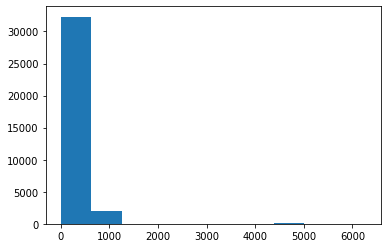

In [ ]:
plt.hist(df['article'].str.len())

Creating a tokenize content function and applying it to text data

In [ ]:
def tokenize_content(content):
  token = nltk.word_tokenize(content)
  l=[]
  for i in token:
    if i.isalpha():
      if i.lower() not in stop_words:
        l.append(i.lower())
  return l

In [ ]:
def list_to_str(content):
  for row in content:
    row = ' '.join(map(str,row))
    return row

<Figure size 1440x720 with 0 Axes>

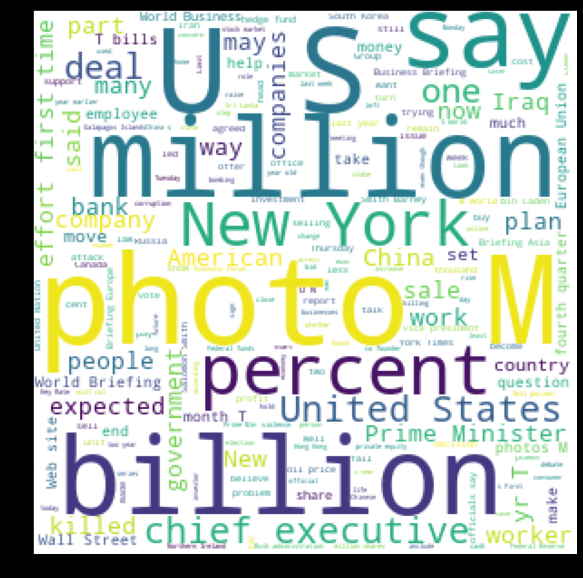

In [ ]:
wordcloud = WordCloud(background_color="white",width=300, height=300).generate(' '.join(df['article'].tolist()))
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)

In [ ]:
fig = go.Figure(data=[go.Scatter(x=df['word_count'], y=df['article'],
    mode='markers',
    marker_size=[40, 60, 80, 100])
])

fig.show(renderer="colab")

In [ ]:
px.bar(data_frame=df, x='headline', y='polarity_article')

Text(0.5, 0, 'Word Count')

Text(0, 0.5, 'Polarity')

Text(0.5, 1.0, 'Polarity of article v/s word count')

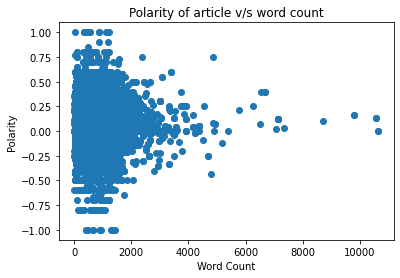

In [ ]:
fig = plt.scatter(x=df["word_count"], y=df["polarity_article"])
plt.xlabel('Word Count')
plt.ylabel('Polarity')
plt.title('Polarity of article v/s word count')
plt.show()


In [ ]:
df = df.set_index('date')

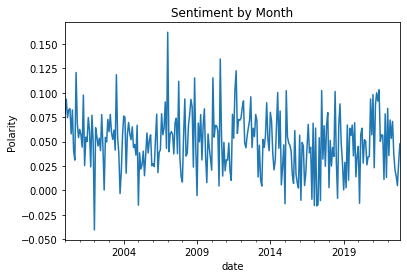

In [ ]:
df.resample('M')['polarity_article'].mean().plot(
    title="Sentiment by Month", ylabel= 'Polarity');


<BarContainer object of 34420 artists>

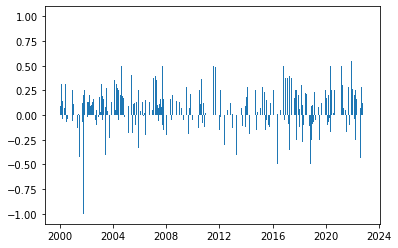

In [ ]:
plt.bar(df.index, df.polarity_article)

In [ ]:
corpus=[]
new= df['article'].str.split()
new=new.values.tolist()
corpus=[word for i in new for word in i]

from collections import defaultdict
dic=defaultdict(int)
for word in corpus:
    if word in stop_words:
        dic[word]+=1

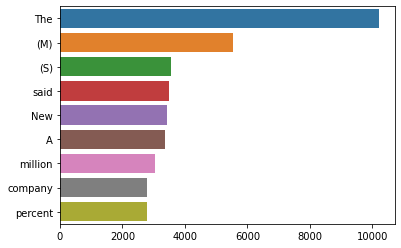

In [ ]:
counter=Counter(corpus)
most=counter.most_common()

words, word_count= [], []
for word,count in most[:40]:
    if (word not in stop_words):
        words.append(word)
        word_count.append(count)

sns.barplot(x = word_count, y= words)

In [ ]:
most_com = [word for line in df['article'] for word in nltk.word_tokenize(line)]
word_features = nltk.FreqDist(most_com)
word_features.most_common(10)

[(',', 68147),
 ('of', 43488),
 ('to', 42179),
 ('the', 41495),
 ('.', 36174),
 ('in', 33701),
 ('and', 29121),
 ('a', 23108),
 (';', 22509),
 ('for', 17694)]

News Article Data + Forex Data Combined

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path="content/articles_by_week/"
files=glob.glob(path+'*.csv')
complete_NLP_df=pd.DataFrame()
for i in files:
  complete_NLP_df=pd.concat([complete_NLP_df, pd.read_csv(i)], axis=0)
  #print(df.shape)
complete_NLP_df.head(2)
  

""


In [ ]:
#JOINING
try:
  mega_df = pd.read_csv("/content/drive/MyDrive/Forex_News_Combined_weekly.csv")


except:
  complete_NLP_df = makeCompleteArticlesDF("/content/articles_by_week")

  complete_NLP_df['YearAndWeek'] = complete_NLP_df.apply(lambda x: x['date'][:4]+'_'+str(x['week']),axis=1)
  nlp_to_join = complete_NLP_df[['article','YearAndWeek']]
  mega_df = pd.merge(weekly_forex_df,nlp_to_join,left_on="YearAndWeek",right_on="YearAndWeek")


  mega_df['article'] = mega_df.groupby('YearAndWeek').transform(lambda x: ' '.join(x))
  mega_df = mega_df.drop_duplicates()
  mega_df.to_csv("Forex_News_Combined_weekly.csv")


#

In [ ]:
#Separating INR 
INR_df = mega_df[['YearAndWeek','INR','article']]

INR_df['Delta'] = INR_df[['INR']].diff()['INR']
INR_df['Label'] = INR_df['Delta'].apply(lambda x: int(x>0) )

INR_df.tail(15)

,YearAndWeek,INR,article,Delta,Label
1178,2022_29,79.907235,Europe’s Heat Wave: 5 Things to Know Britain’s...,0.339337,1
1179,2022_30,79.749454,"Blinken Speaks to Russia’s Foreign Minister, S...",-0.157781,0
1180,2022_31,79.138478,"Taiwan’s leader, Tsai Ing-wen, has vowed to de...",-0.610975,0
1181,2022_32,79.473015,Blinken Urges Rwanda and Congo to End Support ...,0.334536,1
1182,2022_33,79.604758,"Ukraine Chips Away at Russian-Held Region, but...",0.131744,1
1183,2022_34,79.860186,Foes Agree on Nuclear Disaster Risk in Ukraine...,0.255428,1
1184,2022_35,79.738056,The Biden administration asks Congress for $13...,-0.122130,0
1185,2022_36,79.800007,Meghan and Harry’s children could now inherit ...,0.061950,1
1186,2022_37,79.540280,"Giorgia Meloni May Lead Italy, and Europe Is W...",-0.259726,0
1187,2022_38,80.102047,"As fighting intensifies in Ukraine’s east, a f...",0.561767,1


In [ ]:
up_rows = INR_df[INR_df["Label"] == 1]
down_rows = INR_df[INR_df["Label"] == 0]

<Figure size 1440x720 with 0 Axes>

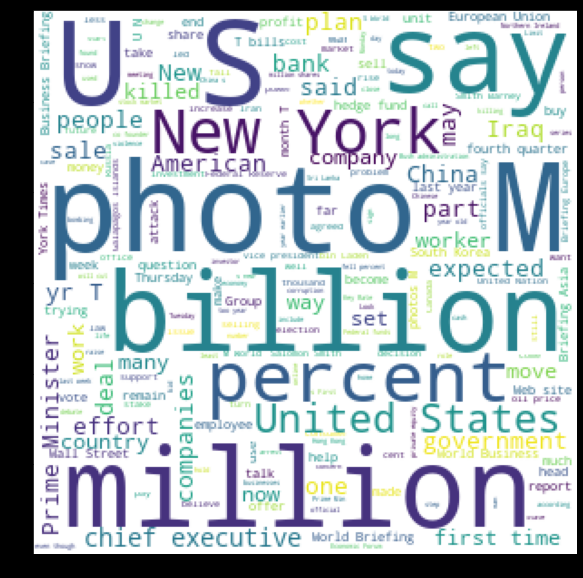

In [ ]:
text =  ' '.join(INR_df['article'].tolist())

wordcloud = WordCloud(background_color="white",width=300, height=300).generate(text)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)

In [ ]:
text_dictionary = wordcloud.process_text(text)
# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud.words_

#print results
print(list(word_freq.items())[:5])
print(list(rel_freq.items())[:5])

[('photo M', 2234), ('U S', 2057), ('million', 1793), ('billion', 1736), ('say', 1690)]
[('photo M', 1.0), ('U S', 0.9207699194270367), ('million', 0.8025962399283796), ('billion', 0.7770814682184423), ('say', 0.756490599820949)]


<Figure size 1440x720 with 0 Axes>

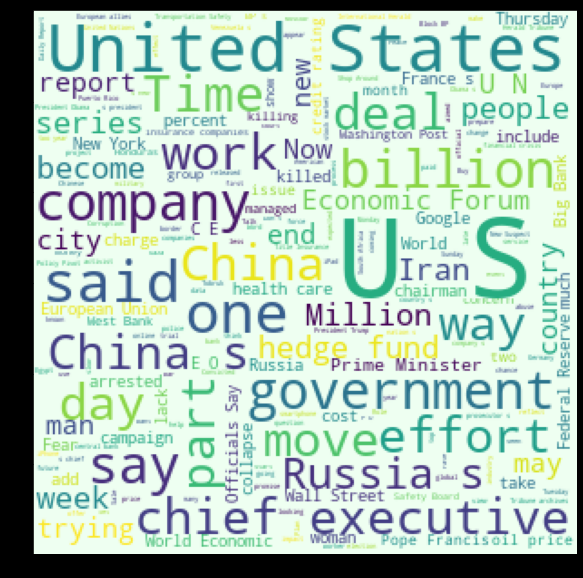

In [ ]:
wordcloud = WordCloud(background_color="#EEFFF1",width=300, height=300).generate(' '.join(up_rows['article'].tolist()))
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)

<Figure size 1440x720 with 0 Axes>

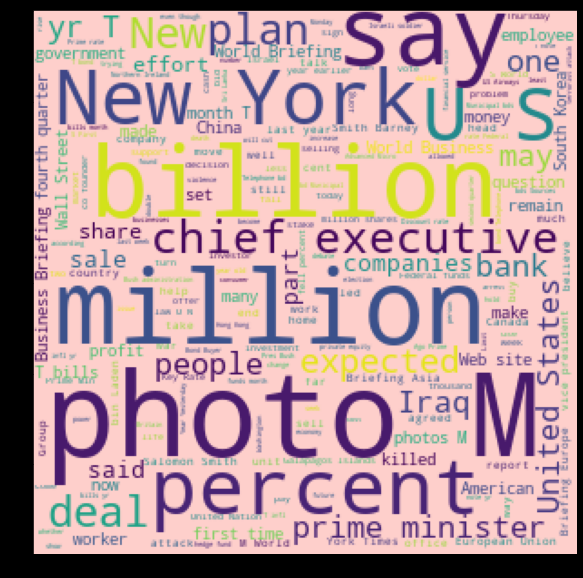

In [ ]:
wordcloud = WordCloud(background_color="#FECFCB",width=300, height=300).generate(' '.join(down_rows['article'].tolist()))
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)

# 3.2 Prediction of Forex with NLP

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In the below cell we load the a dataframe consisting of INR forex rate, the article and a label based on whether the forex rate has gone up or down wrt to the previous week

NOTE current forex rate is average across week. Do we need to look at forex at the end of the week (It takes time for world events to affect Forex!)

## 3.2.1 Loading and preprocessing data

In [ ]:
import pandas as pd
combined_df = pd.read_csv("/content/drive/MyDrive/Forex_News_Combined_weekly.csv")

combined_df['article'] = combined_df['article'].shift(1) #shifting the article(input data) of current data to next week since we want to predict future values not present
combined_df.drop(combined_df.index[0], inplace=True) #Dropping first row since we have shifted and no longer have article data for first row

In [ ]:
import string
import nltk
nltk.download('stopwords')
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
import re
import pdb

ps = PorterStemmer()

def clean_text(text):
   text = "".join([word.lower() for word in text if word not in string.punctuation])
   title = re.split('\W+', text)
   text = [ps.stem(word) for word in title if word not in nltk.corpus.stopwords.words('english')]
   return text

combined_df['article'] = combined_df['article'].apply(clean_text)



combined_df.tail(15)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,Unnamed: 0,YearAndWeek,Unnamed: 0.1,EUR,USD,JPY,CYP,CZK,DKK,EEK,...,IDR,MYR,PHP,THB,RON,BRL,MXN,INR,ILS,article
1178,33595,2022_29,8235.0,0.984822,1.0,138.158315,NaN,24.154689,7.331082,NaN,...,14990.990933,4.451695,56.293705,36.691426,4.863706,5.428170,20.569233,79.907235,3.458363,"[euro, fall, near, pariti, dollar, threshold, ..."
1179,33678,2022_30,8242.0,0.982995,1.0,136.182318,NaN,24.148628,7.317835,NaN,...,14957.732929,4.453622,55.786808,36.646285,4.849310,5.365979,20.466335,79.749454,3.433809,"[europ, heat, wave, 5, thing, know, britain, r..."
1180,33690,2022_31,8249.0,0.979559,1.0,132.986964,NaN,24.122638,7.291164,NaN,...,14880.961495,4.454053,55.461150,36.074283,4.828162,5.204067,20.393825,79.138478,3.371868,"[blinken, speak, russia, foreign, minist, seek..."
1181,33698,2022_32,8256.0,0.975300,1.0,133.828521,NaN,23.871728,7.256637,NaN,...,14818.449827,4.453151,55.461961,35.465527,4.790293,5.148462,20.190908,79.473015,3.295943,"[taiwan, leader, tsai, ingwen, vow, defend, so..."
1182,33709,2022_33,8263.0,0.981932,1.0,134.504691,NaN,24.066661,7.303747,NaN,...,14767.840709,4.461790,55.840061,35.520672,4.796613,5.156551,19.996998,79.604758,3.257953,"[blinken, urg, rwanda, congo, end, support, wa..."
1183,33720,2022_34,8270.0,1.000781,1.0,136.902210,NaN,24.657987,7.443293,NaN,...,14851.039134,4.478781,56.068213,35.971192,4.883825,5.145988,20.049509,79.860186,3.274811,"[ukrain, chip, away, russianheld, region, task..."
1184,33728,2022_35,8277.0,0.999559,1.0,138.462151,NaN,24.554584,7.434237,NaN,...,14853.609919,4.477280,56.320054,36.376419,4.857725,5.125798,20.040551,79.738056,3.318427,"[foe, agre, nuclear, disast, risk, ukrain, lit..."
1185,33737,2022_36,8284.0,1.003225,1.0,142.061622,NaN,24.628535,7.460613,NaN,...,14895.491745,4.494399,56.967853,36.545627,4.867742,5.202650,20.036184,79.800007,3.416696,"[biden, administr, ask, congress, 137, billion..."
1186,33749,2022_37,8291.0,0.994887,1.0,142.779795,NaN,24.404600,7.398533,NaN,...,14884.010767,4.514920,56.988936,36.522200,4.891399,5.170829,19.936979,79.540280,3.415235,"[meghan, harri, children, could, inherit, roya..."
1187,33762,2022_38,8298.0,1.008299,1.0,143.036501,NaN,24.775201,7.498385,NaN,...,15004.277780,4.553708,57.802701,37.129992,4.975320,5.208568,20.028315,80.102047,3.457911,"[giorgia, meloni, may, lead, itali, europ, wor..."


For All our initial modeling efforts for sake of simplicity we show code and results for a single currency, India INR). We later generalize to all currencies

In [ ]:
INR_df = combined_df[['YearAndWeek','INR','article']]
INR_df['Delta'] = INR_df[['INR']].diff()['INR']
INR_df['Label'] = INR_df['Delta'].apply(lambda x: int(x>0) )

INR_df.tail(15)

<ipython-input-4-d38a78501212>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  INR_df['Delta'] = INR_df[['INR']].diff()['INR']
<ipython-input-4-d38a78501212>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  INR_df['Label'] = INR_df['Delta'].apply(lambda x: int(x>0) )


,YearAndWeek,INR,article,Delta,Label
1178,2022_29,79.907235,"[euro, fall, near, pariti, dollar, threshold, ...",0.339337,1
1179,2022_30,79.749454,"[europ, heat, wave, 5, thing, know, britain, r...",-0.157781,0
1180,2022_31,79.138478,"[blinken, speak, russia, foreign, minist, seek...",-0.610975,0
1181,2022_32,79.473015,"[taiwan, leader, tsai, ingwen, vow, defend, so...",0.334536,1
1182,2022_33,79.604758,"[blinken, urg, rwanda, congo, end, support, wa...",0.131744,1
1183,2022_34,79.860186,"[ukrain, chip, away, russianheld, region, task...",0.255428,1
1184,2022_35,79.738056,"[foe, agre, nuclear, disast, risk, ukrain, lit...",-0.122130,0
1185,2022_36,79.800007,"[biden, administr, ask, congress, 137, billion...",0.061950,1
1186,2022_37,79.540280,"[meghan, harri, children, could, inherit, roya...",-0.259726,0
1187,2022_38,80.102047,"[giorgia, meloni, may, lead, itali, europ, wor...",0.561767,1


## 3.2.2 Modeling with Bag of Words(BoW) as a feature extraction technique

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

articles_list = INR_df['article'].tolist()
labels = INR_df['Label'].tolist()

articles_list[0]

train_X,test_X,train_y,test_y = train_test_split( articles_list, labels, test_size=0.2, random_state=42)


vectorize= CountVectorizer(min_df=0.01, max_df=0.8) 
news_vector = vectorize.fit_transform([' '.join(x) for x in train_X]) 
test_vector = vectorize.transform([' '.join(x) for x in test_X]) 


## Visualization with t-SNE

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(news_vector) 


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 953 samples in 0.000s...
[t-SNE] Computed neighbors for 953 samples in 0.119s...
[t-SNE] Computed conditional probabilities for sample 953 / 953
[t-SNE] Mean sigma: 4.531676
[t-SNE] KL divergence after 250 iterations with early exaggeration: 120.293953
[t-SNE] KL divergence after 1000 iterations: 2.342049


[Text(0.5, 1.0, 'Bag of Words Representation T-SNE projection')]

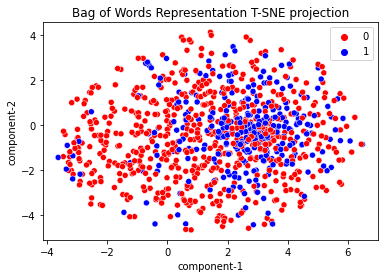

In [ ]:
import seaborn as sns

df = pd.DataFrame()
df["y"] = train_y
df["component-1"] = z[:,0]
df["component-2"] = z[:,1]

sns.scatterplot(x="component-1", y="component-2", hue=df.y.tolist(),
                palette=["red", "blue"],
                data=df).set(title="Bag of Words Representation T-SNE projection") 

### 3.2.2.1 Classification of whether we predict the next week's forex value to go Up(Class 1) or Down(Class 0)

### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(penalty= 'none')
model = lr.fit(news_vector, train_y)


predictions = model.predict(test_vector)


Test Accuracy is:  0.7364016736401674
(array([0.83125  , 0.5443038]), array([0.78698225, 0.61428571]), array([0.80851064, 0.57718121]), array([169,  70]))


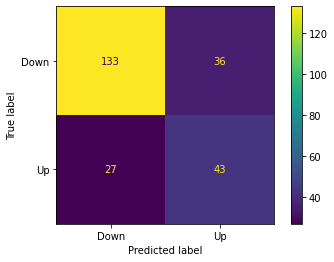

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_BOW_logistic=accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_BOW_logistic)
labels = ["Down","Up"]
ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))

### Logistic Regression with l1 penalization

In [ ]:
 from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(penalty='l1', solver='liblinear')
model = lr.fit(news_vector, train_y)


predictions = model.predict(test_vector)


Test Accuracy is:  0.7405857740585774
(array([0.85430464, 0.54545455]), array([0.76331361, 0.68571429]), array([0.80625   , 0.60759494]), array([169,  70]))


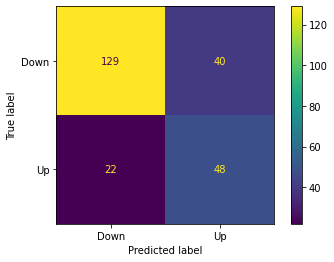

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_BOW_logistic_l1=accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_BOW_logistic_l1)
labels = ["Down","Up"]
ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))

### Logistic Regression with l2 penalization

In [ ]:
 from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(penalty='l2')
model = lr.fit(news_vector, train_y)


predictions = model.predict(test_vector)


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Test Accuracy is:  0.7196652719665272
(array([0.84931507, 0.51612903]), array([0.73372781, 0.68571429]), array([0.78730159, 0.58895706]), array([169,  70]))


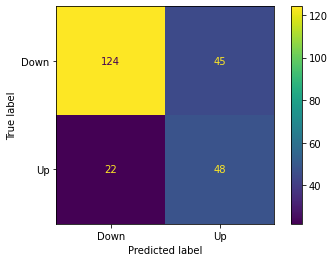

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_BOW_logistic_l2=accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_BOW_logistic_l2)
labels = ["Down","Up"]
ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier( random_state=0)
clf.fit(news_vector, train_y)

predictions = clf.predict(test_vector)


RandomForestClassifier(random_state=0)

Test Accuracy is:  0.6903765690376569
(array([0.75956284, 0.46428571]), array([0.82248521, 0.37142857]), array([0.78977273, 0.41269841]), array([169,  70]))


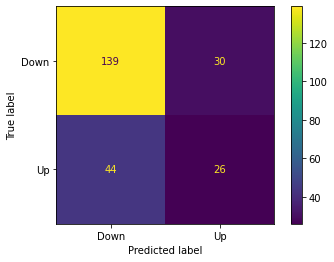

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_BOW_RandF=accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_BOW_RandF)
labels = ["Down","Up"]

ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))


### 3.2.2.2 Prediction of next week's avg forex value using regression

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from copy import deepcopy


INR_df_reg = deepcopy(INR_df)[['INR','article','YearAndWeek']]
INR_df_reg.dropna(inplace = True)

articles_list = INR_df_reg['article'].tolist()
labels = INR_df_reg['INR'].tolist()
indices = [i for i in range(len(labels))]
year_and_week = INR_df_reg['YearAndWeek']



train_X,test_X,train_y,test_y,train_indices,test_indices = train_test_split( articles_list, labels, indices, test_size=0.2, random_state=42)



vectorize= CountVectorizer(min_df=0.01, max_df=0.8) 
news_vector = vectorize.fit_transform([' '.join(x) for x in train_X]) 


## Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

lr=LinearRegression()
model = lr.fit(news_vector, train_y)

test_vector = vectorize.transform([' '.join(x) for x in test_X]) 

predictions = model.predict(test_vector)


In [ ]:
R_squared = model.score(test_vector,test_y)
R_squared

-27.098359147012324

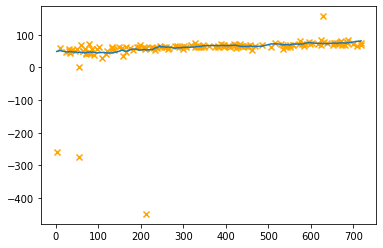

In [ ]:
import matplotlib.pyplot as plt

test_indices_plt,test_y_plt = zip(*sorted(list(zip(test_indices,test_y)),key = lambda x: x[0]))


plt.plot(test_indices_plt,test_y_plt)
plt.scatter(test_indices,predictions,marker='x',color = 'orange')
# plt.

plt.show()

The reason the predictions(Orange x's) do not seem to follow a linear trend despite doing linear regression is that the linear fit is in input space(n-dimensional BoW vector space). This is the result after projecting back into weekly format

In [ ]:
from sklearn.linear_model import Lasso

model_lasso = Lasso()
model_lasso.fit(news_vector, train_y) 

predictions = model_lasso.predict(test_vector)

In [ ]:
R_squared = model_lasso.score(test_vector,test_y)
R_squared

-13.902221147189946

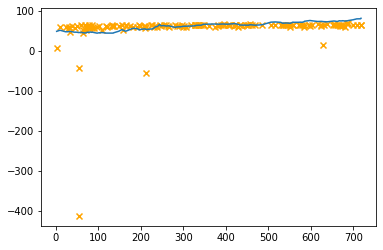

In [ ]:
import matplotlib.pyplot as plt

test_indices_plt,test_y_plt = zip(*sorted(list(zip(test_indices,test_y)),key = lambda x: x[0]))


plt.plot(test_indices_plt,test_y_plt)
plt.scatter(test_indices,predictions,marker='x',color = 'orange')
# plt.

plt.show()

## 3.2.3 Modeling with Tf-Idf as a feature extraction technique

### 3.2.3.1 Classification of whether we predict the next week's forex value to go Up(Class 1) or Down(Class 0)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split

articles_list = INR_df['article'].tolist()
labels = INR_df['Label'].tolist()
indices = [i for i in range(len(labels))]


train_X,test_X,train_y,test_y,train_indices,test_indices = train_test_split( articles_list, labels, indices, test_size=0.2, random_state=42)



tfidf_vectorizer = TfidfVectorizer() 
news_vector = tfidf_vectorizer.fit_transform([' '.join(x) for x in train_X]) 
test_vector = tfidf_vectorizer.transform([' '.join(x) for x in test_X]) 



In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(news_vector) 

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 953 samples in 0.003s...
[t-SNE] Computed neighbors for 953 samples in 0.110s...
[t-SNE] Computed conditional probabilities for sample 953 / 953
[t-SNE] Mean sigma: 0.150359
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.713547
[t-SNE] KL divergence after 1000 iterations: 2.124772


[Text(0.5, 1.0, 'TF-IDF Representation T-SNE projection')]

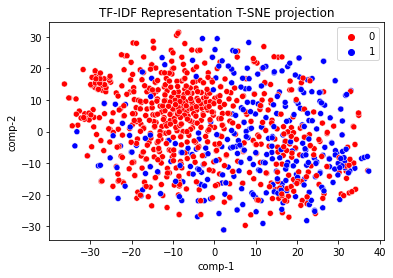

In [ ]:
import seaborn as sns

df = pd.DataFrame()
df["y"] = train_y
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=["red", "blue"],
                data=df).set(title="TF-IDF Representation T-SNE projection") 

### Logistic Regression

## Logistic Regression without regularization

In [ ]:
 from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(penalty= 'none')
model = lr.fit(news_vector, train_y)


predictions = model.predict(test_vector)


In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

accuracy_tfidf_logistic=accuracy_score(test_y, predictions)

Test Accuracy is:  0.7112970711297071
(array([0.71186441, 0.66666667]), array([0.99408284, 0.02857143]), array([0.82962963, 0.05479452]), array([169,  70]))


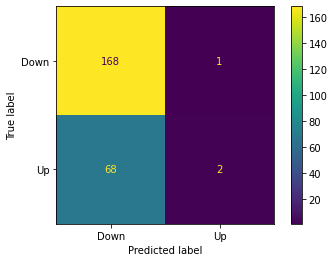

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_tfidf_logistic =accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ", accuracy_tfidf_logistic)
labels = ["Down","Up"]

ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))


### Logistic Regression with l1 penalization

In [ ]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(penalty='l1', solver='liblinear')
model = lr.fit(news_vector, train_y)


predictions = model.predict(test_vector)


Test Accuracy is:  0.7112970711297071
(array([0.71186441, 0.66666667]), array([0.99408284, 0.02857143]), array([0.82962963, 0.05479452]), array([169,  70]))


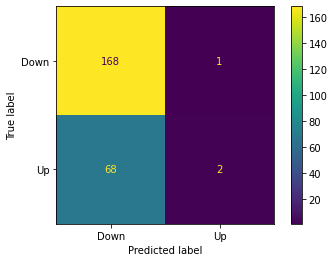

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_tfidf_logistic_l1 =accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_tfidf_logistic_l1)
labels = ["Down","Up"]

ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))

### Logistic Regression with l2 penalization

In [ ]:
 from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(penalty='l2')
model = lr.fit(news_vector, train_y)


predictions = model.predict(test_vector)


Test Accuracy is:  0.7154811715481172
(array([0.72052402, 0.6       ]), array([0.97633136, 0.08571429]), array([0.82914573, 0.15      ]), array([169,  70]))


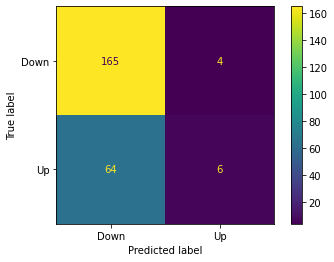

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_tfidf_logistic_l2 =accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_tfidf_logistic_l2)
labels = ["Down","Up"]

ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier( random_state=42)
clf.fit(news_vector, train_y)

predictions = clf.predict(test_vector)

Test Accuracy is:  0.694560669456067
(array([0.72222222, 0.43478261]), array([0.92307692, 0.14285714]), array([0.81038961, 0.21505376]), array([169,  70]))


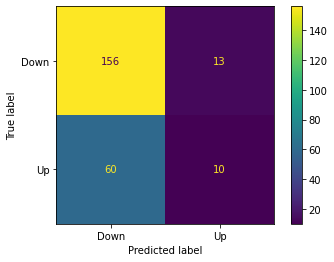

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix


accuracy_tfidf_RandF =accuracy_score(test_y, predictions)
cm = confusion_matrix(test_y,predictions)

print("Test Accuracy is: ",accuracy_tfidf_RandF)
labels = ["Down","Up"]

ConfusionMatrixDisplay(cm, display_labels=labels).plot()

print(precision_recall_fscore_support(test_y, predictions))

### 3.2.3.2 Prediction of next week's avg forex value using regression

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from copy import deepcopy


INR_df_reg = deepcopy(INR_df)[['INR','article']]
INR_df_reg.dropna(inplace = True)

articles_list = INR_df_reg['article'].tolist()
labels = INR_df_reg['INR'].tolist()
indices = [i for i in range(len(labels))]


train_X,test_X,train_y,test_y,train_indices,test_indices = train_test_split( articles_list, labels, indices, test_size=0.2, random_state=42)




tfidf_vectorizer = TfidfVectorizer() # DEFINING THE VECTOR FUNCTION, SPECIFYING THR MIN AND MAX WORD FREQUENCY FILTER
news_vector = tfidf_vectorizer.fit_transform([' '.join(x) for x in train_X]) # TRANSFORMING THE TRAINING DATASET INTO WORD FREQUENCY TRANFORMATION
# print( "THE TABLE OF FREQUENCY WORD DISTRIBUTION" , news_vector.shape)

### Linear Regression without Regularization

In [ ]:
from sklearn.linear_model import LinearRegression

lr=LinearRegression()
model = lr.fit(news_vector, train_y)

test_vector = tfidf_vectorizer.transform([' '.join(x) for x in test_X]) # TRANSFORMING THE TESTING DATASET INTO WORD FREQUENCY TRANFORMATION

predictions = model.predict(test_vector)


In [ ]:
R_squared = model.score(test_vector,test_y)
R_squared

0.6886451788070077

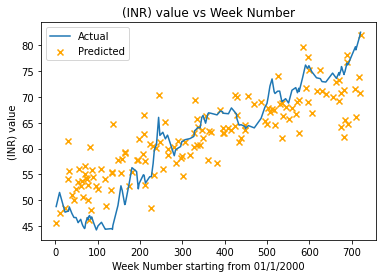

In [ ]:
import matplotlib.pyplot as plt

test_indices_plt,test_y_plt = zip(*sorted(list(zip(test_indices,test_y)),key = lambda x: x[0]))


plt.plot(test_indices_plt,test_y_plt,label="Actual")
plt.scatter(test_indices,predictions,marker='x',color = 'orange',label="Predicted")
plt.ylabel("(INR) value")
plt.xlabel("Week Number starting from 01/1/2000")
plt.title("(INR) value vs Week Number")

plt.legend()


plt.show()

## Lasso Linear Regression

In [ ]:
from sklearn.linear_model import Lasso

model_lasso = Lasso()
model_lasso.fit(news_vector, train_y) 

predictions = model_lasso.predict(test_vector)

In [ ]:
R_squared = model_lasso.score(test_vector,test_y)
R_squared

-0.006061507785788622

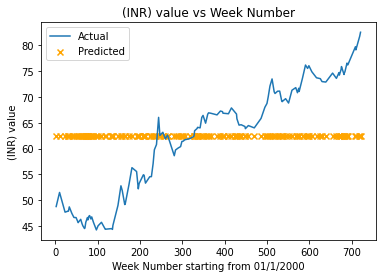

In [ ]:
import matplotlib.pyplot as plt

test_indices_plt,test_y_plt = zip(*sorted(list(zip(test_indices,test_y)),key = lambda x: x[0]))


plt.plot(test_indices_plt,test_y_plt,label="Actual")
plt.scatter(test_indices,predictions,marker='x',color = 'orange',label="Predicted")
plt.ylabel("(INR) value")
plt.xlabel("Week Number starting from 01/1/2000")
plt.title("(INR) value vs Week Number")
plt.legend()

plt.show()

## Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge

model_ridge = Ridge()
model_ridge.fit(news_vector, train_y) 

predictions = model_ridge.predict(test_vector)

In [ ]:
R_squared = model_ridge.score(test_vector,test_y)
R_squared

0.5914692479888939

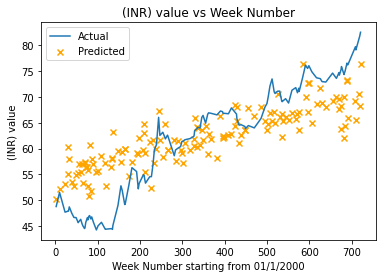

In [ ]:
import matplotlib.pyplot as plt

test_indices_plt,test_y_plt = zip(*sorted(list(zip(test_indices,test_y)),key = lambda x: x[0]))


plt.plot(test_indices_plt,test_y_plt,label="Actual")
plt.scatter(test_indices,predictions,marker='x',color = 'orange',label="Predicted")
plt.ylabel("(INR) value")
plt.xlabel("Week Number starting from 01/1/2000")
plt.title("(INR) value vs Week Number")
plt.legend()

plt.show()

# 3.4 Trying to Generalizing our Best Classification Model to other Currencies

<ipython-input-18-5143235f3c77>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currency_df['Delta'] = currency_df[[currency]].diff()[currency]
<ipython-input-18-5143235f3c77>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currency_df['Label'] = currency_df['Delta'].apply(lambda x: int(x>0) )
<ipython-input-18-5143235f3c77>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

Test Accuracy for EUR is:  0.46443514644351463




(array([0.51639344, 0.41025641]), array([0.47727273, 0.44859813]), array([0.49606299, 0.42857143]), array([132, 107]))


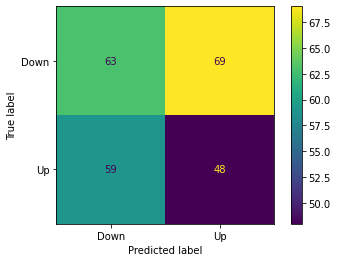

Test Accuracy for CAD is:  0.5146443514644351




(array([0.53488372, 0.49090909]), array([0.552     , 0.47368421]), array([0.54330709, 0.48214286]), array([125, 114]))


<Figure size 432x288 with 0 Axes>

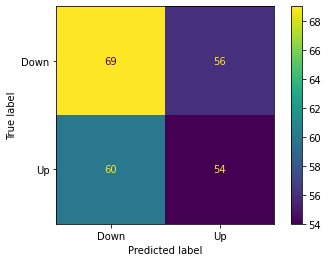

Test Accuracy for INR is:  0.7364016736401674




(array([0.83125  , 0.5443038]), array([0.78698225, 0.61428571]), array([0.80851064, 0.57718121]), array([169,  70]))


<Figure size 432x288 with 0 Axes>

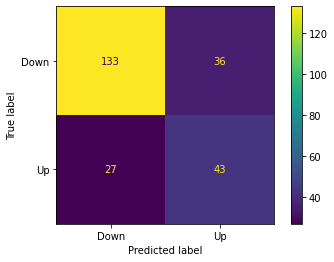

Test Accuracy for CNY is:  0.6192468619246861




(array([0.72988506, 0.32307692]), array([0.74269006, 0.30882353]), array([0.73623188, 0.31578947]), array([171,  68]))


<Figure size 432x288 with 0 Axes>

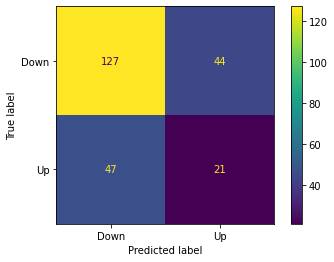

Test Accuracy for KRW is:  0.5481171548117155




(array([0.58518519, 0.5       ]), array([0.60305344, 0.48148148]), array([0.59398496, 0.49056604]), array([131, 108]))


<Figure size 432x288 with 0 Axes>

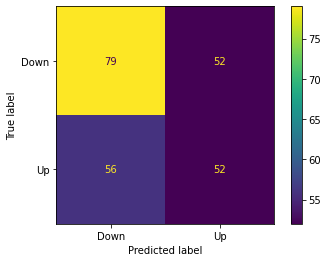

<Figure size 432x288 with 0 Axes>

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay,precision_recall_fscore_support
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

def create_currency_df(combined_df,currency):
    currency_df = combined_df[['YearAndWeek',currency,'article']]
    currency_df['Delta'] = currency_df[[currency]].diff()[currency]
    currency_df['Label'] = currency_df['Delta'].apply(lambda x: int(x>0) )

    return currency_df

def create_general_model_dict(combined_df,top5_currency_list):
    model_dict = {}
    test_data_dict = {}
    for currency in top5_currency_list:
        currency_df = create_currency_df(combined_df,currency)
        articles_list = currency_df['article'].tolist()
        labels = currency_df['Label'].tolist()
        train_X,test_X,train_y,test_y = train_test_split( articles_list, labels, test_size=0.2, random_state=42)
        vectorize= CountVectorizer(min_df=0.01, max_df=0.8) 
        news_vector = vectorize.fit_transform([' '.join(x) for x in train_X]) 
        test_vector = vectorize.transform([' '.join(x) for x in test_X])

        lr=LogisticRegression(penalty= 'none')
        model = lr.fit(news_vector, train_y)
    
        model_dict[currency] = model
        test_data_dict[currency] = (test_vector,test_y)
    
    return model_dict,test_data_dict


def evaluate_accuracy(model,test_data,currency_val):
    test_vector,test_y = test_data
    predictions = model.predict(test_vector)
    accuracy_tfidf_logistic_l1 =accuracy_score(test_y, predictions)
    cm = confusion_matrix(test_y,predictions)

    print(f"Test Accuracy for {currency_val} is: ",accuracy_tfidf_logistic_l1)
    labels = ["Down","Up"]

    ConfusionMatrixDisplay(cm, display_labels=labels).plot()
    print("\n"*3)
    print(precision_recall_fscore_support(test_y, predictions))
    plt.show()
    plt.clf()


top5_list = ['EUR','CAD','INR','CNY','KRW']
model_dict,test_data_dict = create_general_model_dict(combined_df,top5_list)

for currency in model_dict.keys():
    test_data = test_data_dict[currency]
    model = model_dict[currency]
    evaluate_accuracy(model,test_data,currency)
